<a href="https://colab.research.google.com/github/j-claudinei-f/j-claudinei-f/blob/main/SuavizandoImagens.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Suavizando imagens com o método dos gradientes**

José Claudinei Ferreira

Universidade Federal de Alfenas



#**Uma breve introdução**

Eu sempre gosto de iniciar um texto ou uma apresentação agradecendo pela oportunidade de poder falar ou escrever um pouco com sobre coisas que me atraem em matemática. Muitas vezes, eu tento ligar essas coisas com conceito de [positividade definida](https://en.wikipedia.org/wiki/Positive-definite_kernel) e com a ideia de [conhecer uma função](https://www.ams.org/journals/bull/2002-39-01/S0273-0979-01-00923-5/S0273-0979-01-00923-5.pdf) que está presente em algum problema.

Em particular, esse texto teve como motivação, além do convite para a colaboração que levou ou texto [12], o fato que descrevo no parágrafo seguinte.

Há aproximadamente três meses, eu fotografei algumas flores de *Amaryllis* em meu jardim para compartilhar com minha família. 		Antes de enviar a imagem, o aplicativo sugeriu um filtro para remover a sombra projetada pelo meu pé de limão sobre as flores.

Saving Amarilis.jpeg to Amarilis (5).jpeg


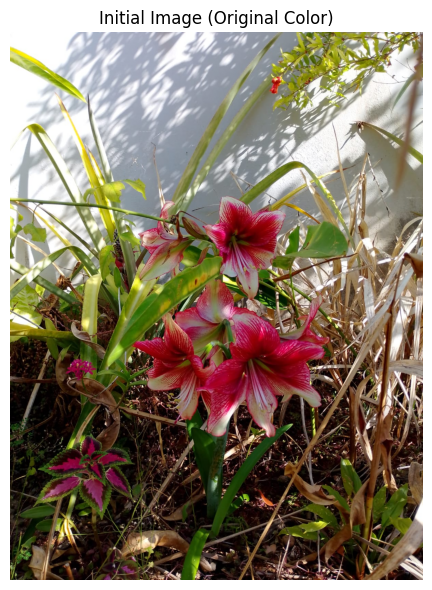

In [6]:
#@title Amaryllis
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import img_as_float
from google.colab import files

# Abrir seletor de arquivo
uploaded = files.upload()  # isso vai abrir a janela para você escolher a imagem

# Pegar o nome do arquivo enviado
image_name = list(uploaded.keys())[0]

# Read the image and convert to float for processing
img = imread(image_name)
img_float = img_as_float(img)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img_float) # Show original color image
plt.title('Initial Image (Original Color)')
plt.axis('off')
plt.tight_layout()
plt.show()

# --- Save Resulting Image ---
# Optional: Add saving functionality if needed
# output_filename = f'gradient_descent_{niter}_{image_name}'
# u_to_save = (np.clip(u_final, 0, 1) * 255).astype(np.uint8)
# imsave(output_filename, u_to_save)
# print(f"Resulting image saved as '{output_filename}'")

Este texto é sobre possibilidades de filtrar uma imagem usando a idea do método dos gradientes para minimizar uma função de variável funcional a valores reais.

#**Sobre funções diferenciáveis**

Aqui neste texto, nós vamos considerar que $V$ é um subconjunto aberto de um espaço vetorial normado $U$, com norma induzida pelo [produto interno](https://en.wikipedia.org/wiki/Inner_product_space) desse espaço (ver [11]).

Seja $u:V\times V=\Omega\to \mathbb{R}$ uma função que supomos ser diferencialvél até a ordem que precisarmos. Então, a [fórmula de Taylor](https://en.wikipedia.org/wiki/Taylor%27s_theorem) de $u(v)$ é dada por $$u(v+h)=u(v)+u'(v)\cdot h+u''(v)\cdot (h,h)+r(h),\qquad \lim_{h\to 0}\frac{r(h)}{\|h\|^2}=0,$$ para $u,u+h\in V$ e alguma função $r:U\to U$.

É comum denotarmos (quando o ambiente permite) $$u'(v)\cdot h=\nabla u(v)\cdot h,$$ como a tranformação linear aplicada no vetor $h$ (o produto interno entre vetor gradiente, que denotamos como $\nabla u(v)$ com o vetor $h$). Denotamos também $$u''(v)\cdot (h,h)=(Hu(v)\cdot h)\cdot h,$$ como a foma quadrática induzida pela transformação bilinear $Hu(v)$ (A hessiana de $u$ em $v$) aplicada no vetor $(h,h)$.

**Obs:**

1. Em [problemas de otimização](https://en.wikipedia.org/wiki/Optimization_problem) é comum olharmos para a direção de maior decrescimento de $u$, no ponto $v$, por meio de $\nabla u(v)$.

2. E para a concavidade de $u(v)$ é comum olharmos para os [autovalores ](https://en.wikipedia.org/wiki/Eigenvalues_and_eigenvectors)de $Hu(v)$ (derivada segunda ou hessiana).

3. Quando $v=(x,y)\in V\times V$, podemos usar a notação $$\nabla u(v)=\left(\frac{\partial\, u(x,y)}{\partial\,x},\frac{\partial\, u(x,y)}{\partial \,y}\right),$$ e $$Hu(v)=Hu(x,y)=\begin{bmatrix}\frac{\partial^2\, u(x,y)}{\partial^2\,x}&\frac{\partial^2\, u(x,y)}{\partial\,y\,\partial \,x}\\\frac{\partial^2\, u(x,y)}{\partial\,x\,\partial \,y}&\frac{\partial^2\, u(x,y)}{\partial^2\,y}\end{bmatrix},$$ em que $$\frac{\partial^2\, u(x,y)}{\partial\,y\,\partial \,x}$$ denota a derivada parcial de $u(v)$ em relação a $x$ e a $y$, e pode ser uma matriz quadrada, quando $x$ e $y$ tiverem coordenadas. Ou seja, $Hu(v)$ é visto como uma matriz simétrica (para mais detalhes veja [9]).

4. Do item anterior, denotamos ainda o [Laplaciano](https://en.wikipedia.org/wiki/Laplace_operator) de $u(v)$ como (detalhes em [10]) $$\Delta u(v)=Tr(Hu(v))=\left(\frac{\partial\, u(x,y)}{\partial^2\,x}+\frac{\partial\, u(x,y)}{\partial^2\,x}\right),$$ em que $Tr(A)$ denota o traço da matriz $A$, ou a soma dos elementos da diagonal de $A$.

5. O traço de uma matriz $A$ é também a soma dos autovalores de $A$. Então, por exemplo $\Delta u(x,y)>0$ indica que, na média, a função $u(x,y)$, no ponto, tende a ser côncava para cima ali. Mas isso não é suficiente para concluir se há mínimo ou máximo local. É apenas uma informação parcial sobre a concavidade.

Por exemplo, para  $u(x,y) = x^2 - 10xy + y^2$. Temos $$Hu(x,y)=\begin{bmatrix}2&-10\\-10&2\end{bmatrix},\qquad \Delta u(x,y) = 2 + 2 = 4 > 0.$$ Os autovalores da hessiana são $\lambda_1 = -8$ e $\lambda_2 = 12$. Portanto, a matriz hessiana tem um autovalor negativo e um positivo. Isso implica que o ponto $(0,0)$, em que $\nabla u(x,y)=(0,0)$, é um ponto de sela. A função tem concavidade para cima em uma direção e para baixo em outra, mesmo com $\Delta u > 0$.

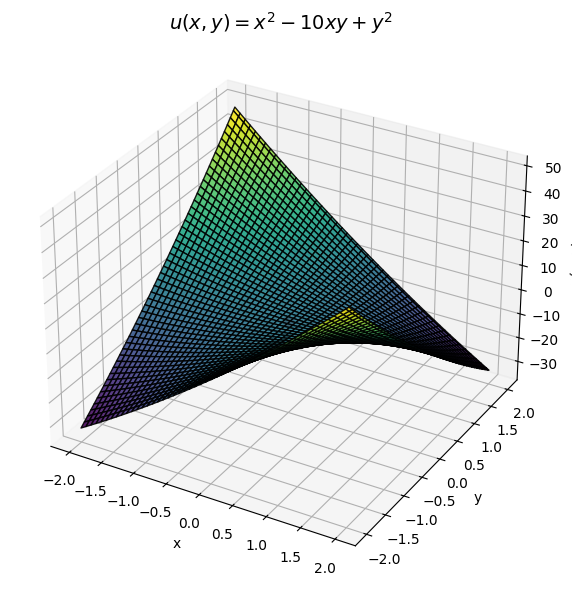

In [8]:
#@title Gráfico de $u(x,y)$
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define a função f(x, y)
def u(x, y):
    return x**2 - 10*x*y + y**2

# Geração da malha (grid)
x = np.linspace(-2, 2, 100)
y = np.linspace(-2, 2, 100)
X, Y = np.meshgrid(x, y)
Z = u(X, Y)

# Criação do gráfico 3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Superfície
ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.9, edgecolor='k')

# Rótulos e título
ax.set_title(r'$u(x, y) = x^2 - 10xy + y^2$', fontsize=14)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('u(x, y)')

# Ponto de sela
ax.scatter(0, 0, u(0,0), color='red', s=50)

plt.tight_layout()
plt.show()

Como $$v_1 = \begin{pmatrix}1\\ -1\end{pmatrix},\qquad v_2 = \begin{pmatrix}1\\ 1\end{pmatrix}$$ são os respectivos autovalores, temos então que $$\begin{pmatrix}
2 & -10\\
-10 & 2
\end{pmatrix}
=
\frac{1}{\sqrt{2}}
\begin{pmatrix}
1 & 1\\
-1 & 1
\end{pmatrix}
\begin{pmatrix}
12 & 0\\
0 & -8
\end{pmatrix}
\frac{1}{\sqrt{2}}
\begin{pmatrix}
1 & -1\\
1 & 1
\end{pmatrix}.$$


A função $u(x,y)$ pode ser escrita, em coordenadas alinhadas com os autovetores, como:
$$
r = \frac{x + y}{\sqrt{2}}, \quad s = \frac{x - y}{\sqrt{2}}\qquad
u(x,y) = -8r^2 + 12s^2.
$$ pois $$u(x,y) =
\begin{pmatrix}
x & y
\end{pmatrix}
\begin{pmatrix}
1 & -5\\
-5 & 1
\end{pmatrix}
\begin{pmatrix}
x\\
y
\end{pmatrix}
= -8\left(\frac{x + y}{\sqrt{2}}\right)^2 + 12\left(\frac{x - y}{\sqrt{2}}\right)^2 = -4(x + y)^2 + 6(x - y)^2.
$$

Essa forma evidencia que a concavidade é negativa na direção do autovetor $v_1 = (1,1)$ e positiva na direção de $v_2 = (1,-1)$, sendo mais acentuada é para cima, pois o maior autovalor é $\lambda_2 = 12$.


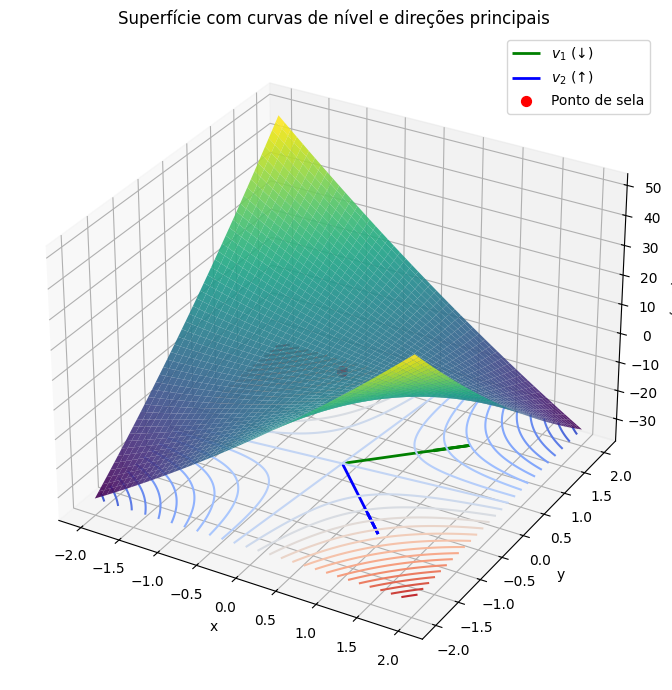

In [10]:
#@title Interpretação gráfica.

# Autovetores normalizados da hessiana
v1 = np.array([1, 1]) / np.sqrt(2)   # concavidade negativa
v2 = np.array([1, -1]) / np.sqrt(2)  # concavidade positiva

# Malha
x = np.linspace(-2, 2, 200)
y = np.linspace(-2, 2, 200)
X, Y = np.meshgrid(x, y)
Z = u(X, Y)

# Z mínimo (para onde projetar as curvas de nível e vetores)
zmin = np.min(Z)

# Figura 3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Superfície
ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.9, edgecolor='none')

# Curvas de nível projetadas no plano z = zmin
ax.contour(X, Y, Z, levels=30, cmap='coolwarm', offset=zmin)

# Autovetores projetados no plano z = zmin
scale = 1.5
ax.quiver(0, 0, zmin, v1[0]*scale, v1[1]*scale, 0, color='green', linewidth=2, label=r'$v_1$ (↓)')
ax.quiver(0, 0, zmin, v2[0]*scale, v2[1]*scale, 0, color='blue', linewidth=2, label=r'$v_2$ (↑)')

# Ponto de sela
ax.scatter(0, 0, u(0, 0), color='red', s=50, label='Ponto de sela')

# Eixos e rótulos
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('u(x, y)')
ax.set_title(r'Superfície com curvas de nível e direções principais')

# Ajustes finais
ax.legend()
plt.tight_layout()
plt.show()

Vejamos agora o caso em que $$u(x,y)=e^{x^2 + y^2}+ x^2 + 2y^2+xy+2x+3y-4.$$

O gradiente é dado por

$$
\begin{aligned}
\nabla u(x,y) &= \left( \frac{\partial u}{\partial x}, \frac{\partial u}{\partial y} \right) \\[2mm]
\frac{\partial u}{\partial x} &= 2x e^{x^2 + y^2} + 2x + y + 2 \\[1mm]
\frac{\partial u}{\partial y} &= 2y e^{x^2 + y^2} + 4y + x + 3
\end{aligned}
$$

Em forma de vetor:
$$
\boxed{
\nabla u(x,y) = \begin{pmatrix} 2x e^{x^2 + y^2} + 2x + y + 2,\,2y e^{x^2 + y^2} + 4y + x + 3 \end{pmatrix}}
$$


Definindo $ r = x^2 + y^2 $, temos as segundas derivadas parciais:

$$
\begin{aligned}
u_{xx} &= 2e^{r}(1 + 2x^2) + 2, \\[4pt]
u_{yy} &= 2e^{r}(1 + 2y^2) + 4, \\[4pt]
u_{xy} &= 4xy\,e^{r} + 1.
\end{aligned}
$$

Assim, a matriz Hessiana de $u$ é dado por:
$$
H(x,y) =
\begin{pmatrix}
2e^{r}(1 + 2x^2) + 2 & 4xy\,e^{r} + 1 \\[6pt]
4xy\,e^{r} + 1 & 2e^{r}(1 + 2y^2) + 4
\end{pmatrix}.
$$

Podemos escrever $H(x,y)$ como soma de duas matrizes positivas:
$$
H(x,y)
= 2e^{r}
\underbrace{\left(\begin{pmatrix}1 & 0\\[2pt]
0 & 1\end{pmatrix} + 2
\begin{pmatrix}x\\y\end{pmatrix}
\begin{pmatrix}x & y\end{pmatrix}\right)}_{M(x,y)}
+
\underbrace{
\begin{pmatrix}
2 & 1\\[2pt]
1 & 4
\end{pmatrix}
}_{N}.
$$

Note que:
- $M(x,y) = I_2 + 2vv^T$, com $v = (x, y)^T$, possui autovalores $1$ e $1 + 2(x^2 + y^2) \ge 1$; logo, $M(x,y)$ é definida positiva.
- $2e^{r} > 0$ para todo $(x,y)$, então $2e^{r}M(x,y)$ é definida positiva.
- A matriz $N$ tem determinante $2\cdot4 - 1^2 = 7 > 0$ e traço $6 > 0$; portanto, $N$ também é definida positiva [veja também o teorema do círculo de Gershgorin](https://en.wikipedia.org/wiki/Gershgorin_circle_theorem)).

Sendo a soma de duas matrizes definidas positivas, $H(x,y)$ é definida positiva para todo $(x,y)$.

$$
\boxed{\text{Logo, } u(x,y) \text{é estritamente convexa em} \mathbb{R}^2.}
$$

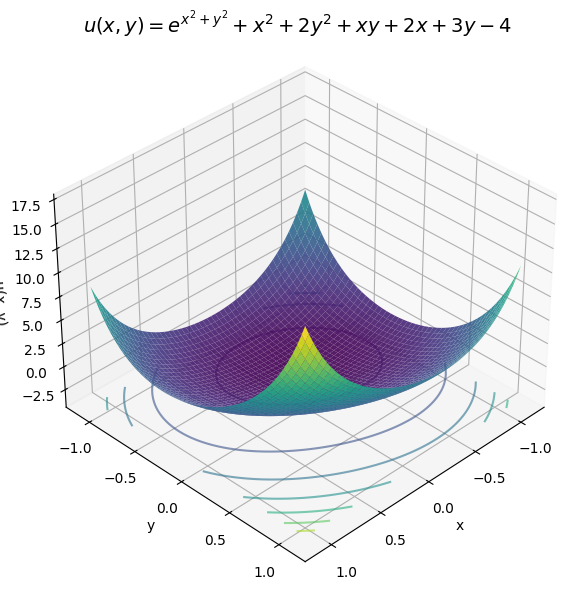

In [12]:
#@title Gráfico de u(x,y)
# Função convexa
def u(x, y):
    return np.exp(x**2 + y**2) + x**2 + 2*y**2 + x*y + 2*x + 3*y - 4

# Geração da malha (grid)
x = np.linspace(-1.1, 1.1, 200)
y = np.linspace(-1.1, 1.1, 200)
X, Y = np.meshgrid(x, y)
Z = u(X, Y)

# Criação do gráfico 3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Superfície
ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.9, edgecolor='none')

# Contornos no plano XY
ax.contour(X, Y, Z, zdir='z', offset=Z.min(), cmap='viridis', alpha=0.6)

# Rótulos e título
ax.set_title(r'$u(x, y) = e^{x^2 + y^2} + x^2 + 2y^2 + xy + 2x + 3y - 4$', fontsize=14)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('u(x, y)')

# Ponto mínimo global
xm, ym = -0.344692350000,-0.399740880000
#ax.scatter(xm, ym, u(xm, ym), color='red', label='mínimo global aproximado (-0.345, -0.4)')
#ax.legend()

# Melhor ângulo de visualização
ax.view_init(elev=35, azim=45)

plt.tight_layout()
plt.show()

Segue do [teorema de Bolzano-Weierstrass](https://en.wikipedia.org/wiki/Bolzano%E2%80%93Weierstrass_theorem) que existe um (único) ponto de mínimo dessa função. Podemos aproximar esse ponto caminhando sobre a curva $c(t)=(x(t),y(t))$, dada pela equação diferencial $$\begin{cases}c'(t)%=(x'(t),y'(y))
&=-\nabla V(c(t))\\\\c(0)&=c_0\end{cases},$$		cuja solução numérica da equação leva ao [método dos gradientes](https://en.wikipedia.org/wiki/Gradient_descent) ([3]): 		$$\begin{cases}c_{n+1}=c_n-h_n\nabla V(c_n)\\\\c_0=(x_0,y_0)\end{cases}.$$

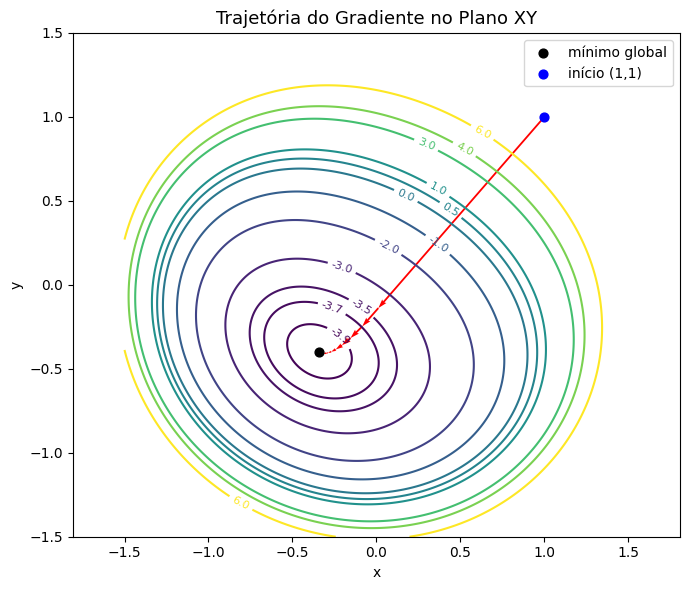

In [16]:
#@title Trajetória do metodo dos gradiente em forma de setas
# Gradiente
def grad(x, y):
    e = np.exp(x**2 + y**2)
    ux = 2*x*e + 2*x + y + 2
    uy = 2*y*e + 4*y + x + 3
    return np.array([ux, uy])

# Gradiente descendente
def gradient_descent(x0, lr=0.05, tol=1e-8, max_iter=10000):
    x = np.array(x0, dtype=float)
    path = [x.copy()]
    for i in range(max_iter):
        g = grad(x[0], x[1])
        if np.linalg.norm(g) < tol:
            break
        x = x - lr * g
        path.append(x.copy())
    return np.array(path)

# Trajetória
x0 = [1, 1]
traj = gradient_descent(x0, lr=0.05)

# Malha para curvas de nível
x = np.linspace(-1.5, 1.5, 300)
y = np.linspace(-1.5, 1.5, 300)
X, Y = np.meshgrid(x, y)
Z = u(X, Y)

# Ponto mínimo
xm, ym = -0.34469235, -0.39974088

lev=[-4,-3.9,-3.7,-3.5,-3,-2,-1,0,0.5,1,3,4,6]
# --- Gráfico de curvas de nível ---
plt.figure(figsize=(7,6))
cont = plt.contour(X, Y, Z, levels=lev, cmap='viridis')
plt.clabel(cont, inline=True, fontsize=8, fmt="%.1f")

# Trajetória do gradiente em forma de setas
for i in range(len(traj)-1):
    x_start, y_start = traj[i]
    dx = traj[i+1,0] - x_start
    dy = traj[i+1,1] - y_start
    plt.quiver(x_start, y_start, dx, dy, angles='xy', scale_units='xy', scale=1, color='red', width=0.003)

# Ponto mínimo
plt.scatter(xm, ym, color='black', s=40, label='mínimo global')
plt.scatter(traj[0,0], traj[0,1], color='blue', s=40, label='início (1,1)')

# Rótulos e título
plt.title("Trajetória do Gradiente no Plano XY", fontsize=13)
plt.xlabel("x")
plt.ylabel("y")
plt.axis('equal')
plt.legend()
plt.tight_layout()
plt.show()

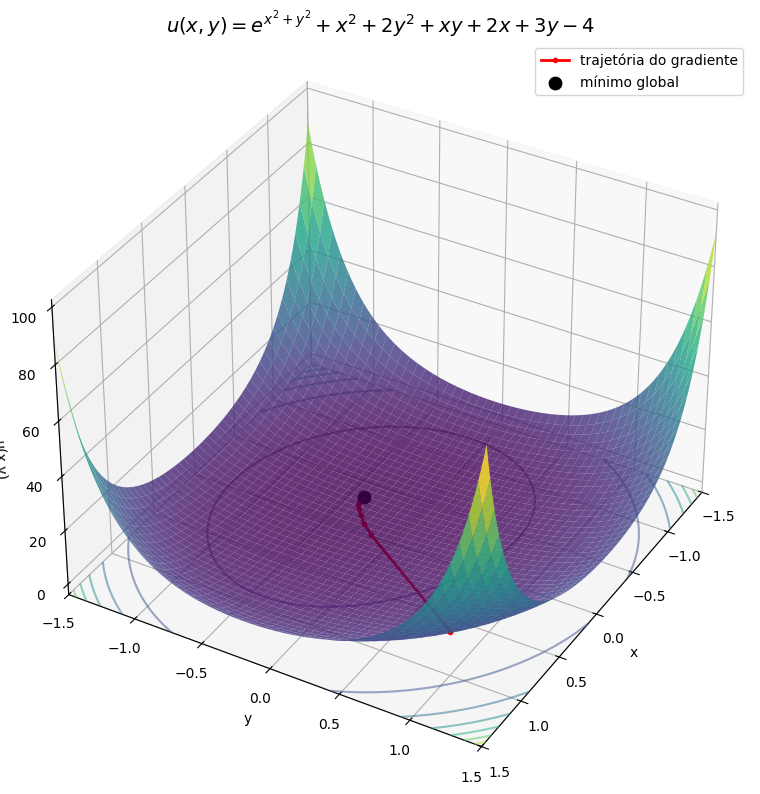

In [17]:
#@title Curva e superfície
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

# Calculate the z-coordinates for the trajectory
# Assuming 'u' function and 'traj' array are defined in previous cells
traj_z = u(traj[:,0], traj[:,1])

# Superfície com leve transparência
ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8, edgecolor='none')

# Trajetória do gradiente
ax.plot3D(traj[:,0], traj[:,1], traj_z, color='red', marker='o', markersize=3, linewidth=2, label='trajetória do gradiente')

# Ponto mínimo
# Assuming xm, ym, and the u function are defined in previous cells
zm = u(xm, ym) # Calculate the z-value for the minimum point
ax.scatter(xm, ym, zm, color='black', s=80, label='mínimo global')

# Contornos projetados na base
ax.contour(X, Y, Z, zdir='z', offset=Z.min(), cmap='viridis', alpha=0.5)

# Ajuste da câmera
ax.view_init(elev=35, azim=30)

# Limites dos eixos
ax.set_xlim([-1.5, 1.5])
ax.set_ylim([-1.5, 1.5])
ax.set_zlim([Z.min(), Z.max()])

# Rótulos e título
ax.set_title(r'$u(x, y) = e^{x^2 + y^2} + x^2 + 2y^2 + xy + 2x + 3y - 4$', fontsize=14)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('u(x,y)')
ax.legend()

plt.tight_layout()
plt.show()

**Obs:** Encontrar mínimos de funções é útil em muitos problemas envolvendo matemática. Um exemplo é o da resolução da equação polinômial $p(z)=0$ (veja comentários sobre isso neste [link](https://github.com/j-claudinei-f/j-claudinei-f/blob/main/ArtigoSigmae2024.ipynb)), por meio da minimização de $|p(z)|^2$, para $z=x+yi$, $x,y\in \mathbb{R}$ e $i$ a unidade imaginária, que tem a propriedade $i^2=-1$. Veja também esse [link](https://github.com/j-claudinei-f/j-claudinei-f/blob/main/Direcao_maior_decrescimento.ipynb) para problemas de minimização com restrições de domínio. Nesse [link](https://github.com/j-claudinei-f/j-claudinei-f/blob/main/Subgrad.ipynb) tem exemplo de minimização de função não derivável em todo ponto.

#**Um exemplo de um problema de extensão de função**

Seja a função definida no retângulo central  
$$
u_0(x,y)=2-(x^2+y^2),\qquad (x,y)\in[-1,1]\times[-1,1].
$$

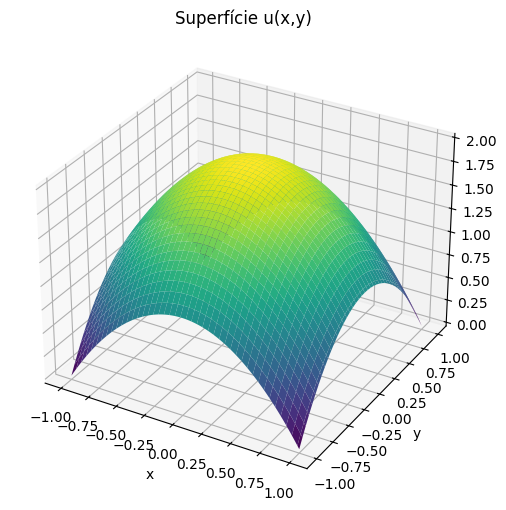

In [ ]:
#@title Gráfico da função
import numpy as np
import matplotlib.pyplot as plt

# Definir domínio da função original
Nx, Ny = 128, 128
x = np.linspace(-1, 1, Nx)
y = np.linspace(-1, 1, Ny)
X, Y = np.meshgrid(x, y)

# Função original: 2 - (x^2 + y^2), truncada para valores não-negativos
u0 = 2 - (X**2 + Y**2)
u0[u0 < 0] = 0   # zera valores negativos

# Need to define 'fig' before using it to add subplots
fig = plt.figure(figsize=(14,10)) # Added this line to define fig

# 3D original
ax3 = fig.add_subplot(2,2,3, projection='3d')
ax3.plot_surface(X, Y, u0, cmap='viridis', edgecolor='none')
ax3.set_title("Superfície u(x,y)")
ax3.set_xlabel("x")
ax3.set_ylabel("y")
plt.tight_layout()
plt.show()

Queremos encontrar uma função $v:\Omega_{\mathrm{big}}\to \mathbb{R}$, definida em um retângulo maior $$\Omega_{\mathrm{big}}=[-s,s]\times[-s,s],\qquad s>1,$$ que seja igual à função dada no retângulo dado, mas seja nula fora de um retângulo intermediário.

Dito isso, podemos pensar numa formar de resolver o que queremos buscando uma função que tenha vetor gradiente como módulo muito pequeno, na maioria do conjunto $\Omega=\Omega_{\mathrm{big}}\setminus\Omega_{\mathrm{center}}$, para $\Omega_{\mathrm{center}}=[-1,1]\times[-1,1]$.

Ou seja, que $$J(v)=\frac{1}{2}\int_{\Omega_{\mathrm{big}}\setminus\Omega_{\mathrm{center}}}|\nabla v(x,y)|^2dxdy,\qquad v(x,y)=u(x,y),\qquad (x,y)\in \Omega_{\mathrm{center}},$$ seja pequeno, ou o menor possível.

Como $$J(v+h)=\frac{1}{2} \int_\Omega |\nabla v+\nabla h|^2 \, dx =J(u)+\left(\int_\Omega \nabla v\cdot \nabla h \, dx \right)+\frac{1}{2} \int_\Omega |\nabla h|^2 \, dx ,$$ e segue que $$J'(v)\cdot h= \int_\Omega \nabla v\cdot \nabla h \, dx ,$$ e que $$J''(v)\cdot(h,k)=\frac{1}{2}\int_\Omega \nabla h\nabla k \, dx,$$ em que $J'(v)$ é a derivada primeira e $J''(v)$ é a derivada segunda de $J(v)$, porque $$\int_\Omega |\nabla h|^2 \, dx \leq \|h\|_{H_0^1}^2\Rightarrow \lim_{h\to 0}\frac{1}{\|h\|_{H_0^1}}\int_\Omega |\nabla h|^2 \, dx=0.\tag{1}$$

**Obs.** É comum denotar $J'(v)=\nabla J(v)$.

Note que, pela [fórmula de Green](https://en.wikipedia.org/wiki/Green%27s_theorem), se $w$ e $\nabla w$ forem nulas na fronteira $\partial{\Omega}$, então $$
\int_\Omega -\Delta v \cdot w \, dx = \int_\Omega \nabla v \cdot \nabla w \, dx - \int_{\partial \Omega} \frac{\partial v}{\partial n} w \, dS,
$$

Temos que o [adjunto do operador](https://en.wikipedia.org/wiki/Hermitian_adjoint) $\nabla$ é o operador $\nabla^*=-\nabla$, por causa das igualdades envovendo produtos internos $$\langle \nabla v , \nabla w\rangle=\int_\Omega \nabla v \cdot \nabla w\, dx=\int_\Omega \nabla ^*(\nabla v ) w\, dx =\langle \nabla ^*(\nabla v ),w\rangle=\langle -\Delta v,w\rangle.$$ E segue que $$\nabla^* \nabla=-\Delta.$$

Desta forma $$\nabla J(v)=-\Delta v$$ e $$J'(v)\cdot h=\langle-\Delta v, h\rangle=\int_{\Omega}(-\Delta v)hdx.$$

Ainda, $$J''(v)\cdot(h,k)=\frac{1}{2}\langle -\Delta h,k\rangle,$$ e seque que $$2J''(v)=2HJ(v)=-\Delta$$ é positiva definida.

Segue que $$J(v+h)=J(v)+J'(v)\cdot h+J''(v)\cdot(h,h)\geq J(v)+J'(v)\cdot h+\frac{1}{4}\int_\Omega |\nabla h|^2 \, dx \geq J(v)+J'(v)\cdot h+\frac{C}{4}\|h\|^2 $$ pela  [desigualdade de Poincaré](https://en.wikipedia.org/wiki/Poincar%C3%A9_inequality), o que nos diz que $J(v)$ é uma função (fortemente onvexa) convexa.

Isso nos diz que, se ponto $u \in H_0^1(\Omega)$ for um minimizador de $J$ então será o único minimizador. Ainda, sua derivada direcional em qualquer direção $h \in H_0^1(\Omega)$ será nula:
$$
\left. \frac{d}{dt} J(u + t h) \right|_{t = 0} = 0.
$$

Essa interpretação mostra que a solução fraca $u$ minimiza a **energia total** associada ao sistema, composta pela energia potencial elástica (primeiro termo) e pelo trabalho da força externa $f$ (segundo termo).

Então
$$
\frac{d}{dt} J(v + t h) = \nabla J(v)\cdot h=0,
$$ o que nos diz que $$-\Delta v(x,y) =0,\qquad (x,y)\in \Omega.$$




Mas nós não queremos essa última igualdade. Por isso, vamos buscar minimizar $J(v)$ inspirados pelo método dos gradientes, ou seja, partindo de uma função incial adequada.

Como a função $u(x,y)$ não é negativa, usamos o seguinte procedimento: seja  
$$
u_0^{\mathrm{vis}}(x,y)=\max\{0,\,u(x,y)\}
$$  

Escolhendo, por exemplo, $s=1.4$.

Queremos agora uma função de três váriáveis, que vamos denotar por $v(x,y,t)$, sendo  
$$
v(x,y,0)=
\begin{cases}
u_0^{\mathrm{vis}}(x,y), & (x,y)\in\Omega_{\mathrm{center}},\\[6pt]
0, & (x,y)\in\Omega_{\mathrm{big}}\setminus\Omega_{\mathrm{center}}.
\end{cases}
$$  

Introduzimos a máscara booleana $M(x,y)$ tal que $M=1$ em $\Omega_{\mathrm{center}}$ (região que será preservada) e $M=0$ fora.

Então vamos buscar resolver (numéricamente) a equação (a evolução condicionada por difusão que preserva a região central) formulada como  
$$
\frac{\partial u}{\partial t}=\Delta u\,(1-M(x,y)),\qquad (x,y)\in\Omega_{\mathrm{big}},\; t>0,\tag{*}
$$  
com condições de contorno de Dirichlet homogêneas  
$$
u(x,y,t)=0,\qquad (x,y)\in\partial\Omega_{\mathrm{big}},\; t\ge 0.
$$

**Obs:** Note que, na equação $(*)$ temos a expressão $$\frac{\partial u}{\partial t}=\Delta u=-\nabla J(u),\qquad (x,y)\in\Omega,\; t>0,$$ embutida, que seria derivada do método dos gradientes para minimizar $J(u)$.

No contexto discreto, com malha uniforme de espaçamento $h$ nas duas direções e índices $(i,j)$, o Laplaciano por diferenças finitas de cinco pontos é aproximado por  
$$
(\Delta u)_{i,j}\approx \frac{u_{i+1,j}+u_{i-1,j}+u_{i,j+1}+u_{i,j-1}-4u_{i,j}}{h^2}.
$$  
Usando o esquema explícito de Euler no tempo com passo $\Delta t$, a atualização numérica condicionada é  
$$
u_{i,j}^{n+1}=
\begin{cases}
u_{i,j}^{n}, & M_{i,j}=1,\\[6pt]
u_{i,j}^{n}+\Delta t\,(\Delta u)_{i,j}^{n}, & M_{i,j}=0,
\end{cases}
$$  
seguida da reimposição $u_{i,j}^{n+1}=0$ para todos os nós $(i,j)$ que pertencem à fronteira $\partial\Omega_{\mathrm{big}}$ (condição de Dirichlet).

Nota sobre estabilidade numérica: para o esquema explícito da equação do calor em duas dimensões é comum exigir a condição de estabilidade tipo CFL  
$$
\Delta t \le \frac{h^2}{4},
$$  
portanto $\Delta t$ deve ser escolhido em função de $h$ para evitar instabilidades; alternativas implícitas ou semi-implícitas permitem passos de tempo maiores.

Para visualização 3D, interpretamos a intensidade como altura da superfície  
$$
z=u(x,y,t),
$$  
de modo que a superfície original é a parábola invertida $z=2-(x^2+y^2)$ truncada em zero sobre $[-1,1]^2$, e a superfície obtida após evolução difusiva coincide com a original dentro de $\Omega_{\mathrm{center}}$ e é suavemente preenchida fora, aproximando-se do plano $z=0$ nas bordas de $\Omega_{\mathrm{big}}$.

Em termos práticos e de implementação, discretiza-se o retângulo maior com uma grade uniforme, insere-se $u_0^{\mathrm{vis}}$ centrado na grade interna correspondente a $[-1,1]^2$, define-se a máscara $M$ (valendo $1$ na subgrade central), aplica-se a iteração explícita acima por $T$ passos e plota-se, para comparação, (i) o mapa 2D de $u_0^{\mathrm{vis}}$, (ii) o mapa 2D de $u(\cdot,\cdot,T)$, (iii) a superfície 3D de $u_0^{\mathrm{vis}}$ e (iv) a superfície 3D de $u(\cdot,\cdot,T)$.

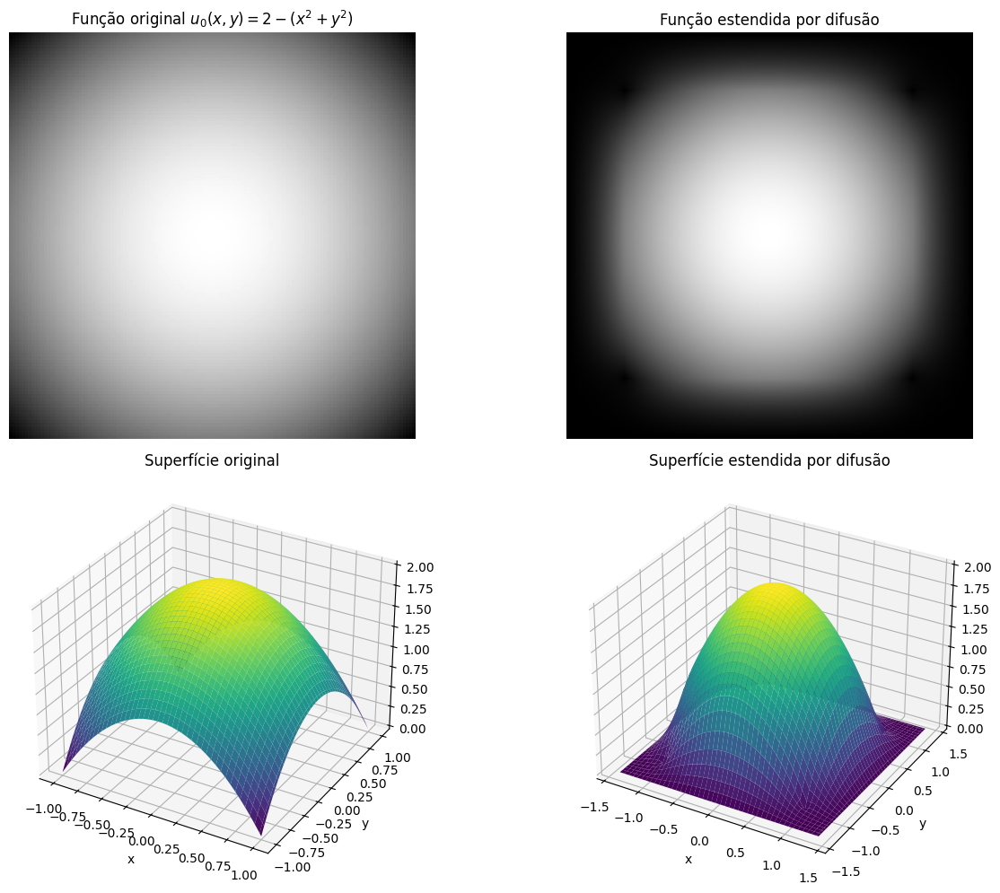

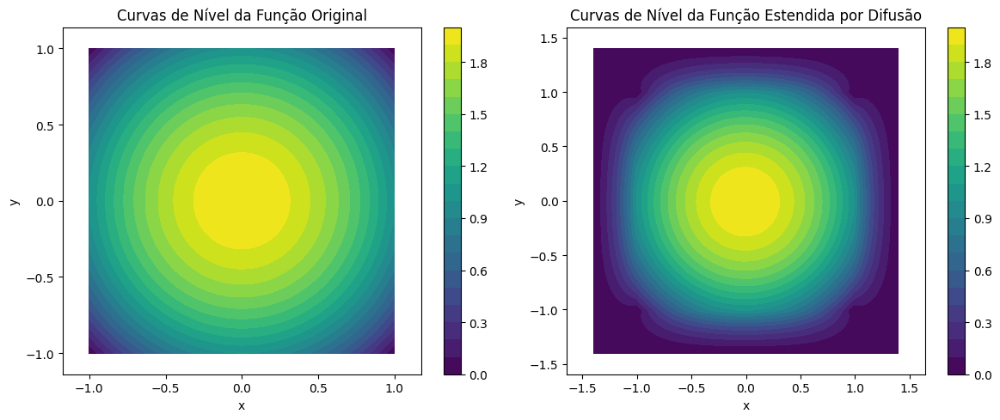

In [ ]:
#@title Extensão de função por difusão
import numpy as np
import matplotlib.pyplot as plt

# Definir domínio da função original
Nx, Ny = 128, 128
x = np.linspace(-1, 1, Nx)
y = np.linspace(-1, 1, Ny)
X, Y = np.meshgrid(x, y)

# Função original: 2 - (x^2 + y^2), truncada para valores não-negativos
u0 = 2 - (X**2 + Y**2)
u0[u0 < 0] = 0   # zera valores negativos

# Escala do retângulo maior
scale = 1.4
Nx_big, Ny_big = int(Nx*scale), int(Ny*scale)

# Criar retângulo maior inicializado com zero
u = np.zeros((Nx_big, Ny_big))

# Colocar função original no centro
x_offset = (Nx_big - Nx) // 2
y_offset = (Ny_big - Ny) // 2
u[x_offset:x_offset+Nx, y_offset:y_offset+Ny] = u0

# Criar máscara da região central (não difunde lá)
mask_center = np.zeros_like(u, dtype=bool)
mask_center[x_offset:x_offset+Nx, y_offset:y_offset+Ny] = True

# Difusão
dt = 0.1
T = 1000
for n in range(T):
    lap = (
        np.roll(u, 1, axis=0) + np.roll(u, -1, axis=0) +
        np.roll(u, 1, axis=1) + np.roll(u, -1, axis=1) -
        4*u
    )
    u[~mask_center] += dt * lap[~mask_center]
    # Condição de contorno nula
    u[0,:] = 0
    u[-1,:] = 0
    u[:,0] = 0
    u[:,-1] = 0

# Gráficos
fig = plt.figure(figsize=(14,10))

# 2D original
ax1 = fig.add_subplot(2,2,1)
ax1.imshow(u0, cmap='gray', extent=[-1,1,-1,1])
ax1.set_title(r"Função original $u_0(x,y)=2-(x^2+y^2)$")
ax1.axis('off')

# 2D difusão
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(u, cmap='gray')
ax2.set_title("Função estendida por difusão")
ax2.axis('off')

# 3D original
ax3 = fig.add_subplot(2,2,3, projection='3d')
ax3.plot_surface(X, Y, u0, cmap='viridis', edgecolor='none')
ax3.set_title("Superfície original")
ax3.set_xlabel("x")
ax3.set_ylabel("y")

# 3D difusão
X_big, Y_big = np.meshgrid(
    np.linspace(-scale, scale, Nx_big),
    np.linspace(-scale, scale, Ny_big)
)
ax4 = fig.add_subplot(2,2,4, projection='3d')
ax4.plot_surface(X_big, Y_big, u, cmap='viridis', edgecolor='none')
ax4.set_title("Superfície estendida por difusão")
ax4.set_xlabel("x")
ax4.set_ylabel("y")

plt.tight_layout()
plt.show()

# Contour plots
fig_contour, axes_contour = plt.subplots(1, 2, figsize=(12, 5))

# Contour plot of original function
contour_original = axes_contour[0].contourf(X, Y, u0, levels=20, cmap='viridis')
fig_contour.colorbar(contour_original, ax=axes_contour[0])
axes_contour[0].set_title("Curvas de Nível da Função Original")
axes_contour[0].set_xlabel("x")
axes_contour[0].set_ylabel("y")
axes_contour[0].axis('equal')

# Contour plot of diffused function
# Create centered grid for the diffused function contour plot
X_big_centered = np.linspace(-scale, scale, Nx_big)
Y_big_centered = np.linspace(-scale, scale, Ny_big)
X_big_mesh, Y_big_mesh = np.meshgrid(X_big_centered, Y_big_centered)


contour_diffused = axes_contour[1].contourf(X_big_mesh, Y_big_mesh, u, levels=20, cmap='viridis')
fig_contour.colorbar(contour_diffused, ax=axes_contour[1])
axes_contour[1].set_title("Curvas de Nível da Função Estendida por Difusão")
axes_contour[1].set_xlabel("x")
axes_contour[1].set_ylabel("y")
axes_contour[1].axis('equal')

plt.tight_layout()
plt.show()

#**Sobre imagens**

Uma imagem em duas dimenesões pode ser vista como o gráfico de uma função $u(x,y)$, para $(x,y)$ em algum retângulo. Então podemos usar a ideia que discutimos acima para suavizar uma imagem.

Para mostrar um pouco sobre isso, considere os gráficos a seguir.

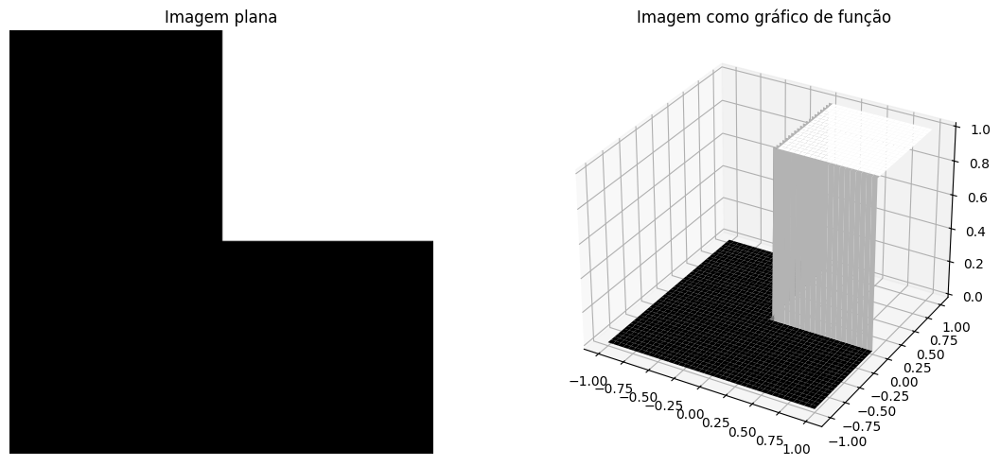

In [ ]:
#@title Imagem como gráfico de uma função
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# Definir domínio
N = 201
x = np.linspace(-1, 1, N)
y = np.linspace(-1, 1, N)
X, Y = np.meshgrid(x, y)

# Função descontinua f(x,y)
f = np.zeros_like(X)
f[(X>0) & (Y>0)] = 1

# Visualização 2D e 3D
fig=plt.figure(figsize=(12,5))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(f,origin='lower', cmap='gray')
ax1.set_title("Imagem plana") # Corrected: use set_title instead of title
ax1.axis('off')
ax2 = fig.add_subplot(1,2,2, projection='3d')
ax2.plot_surface(X, Y, f, cmap='gray', edgecolor='none')
ax2.set_title("Imagem como gráfico de função")
#ax1.axis('off')

plt.tight_layout()
plt.show()

A imagem à esquerda pode ser vista como uma função constante por partes, e no caso descontínua, que mostramos na figura à direita. Note que nesse caso há uma falha no pacote que faz gráficos, porque era para o quadrado branco nçao ter essa ligação cinza com a parte preta do gráfico.


Consideramos a equação (a evolução condicionada por difusão que preserva a região central) formulada como  
$$
\frac{\partial v}{\partial t}=\Delta v\qquad (x,y)\in\Omega_{\mathrm{big}},\; t>0,\tag{*}
$$  
com condições de contorno $v(x,y,0)=u(x,y).$

**Obs:** Note que, na equação $(*)$ temos a expressão $$\frac{\partial u}{\partial t}=\Delta u=-\nabla J(u),\qquad (x,y)\in\Omega,\; t>0,$$ embutida, que seria derivada do método dos gradientes para minimizar $$J(v)=\frac{1}{2}\int_{\Omega_{\mathrm{big}}\setminus\Omega_{\mathrm{center}}}|\nabla v(x,y)|^2dxdy,\qquad v(x,y)=u(x,y),\qquad (x,y)\in \Omega_{\mathrm{center}},$$ seja pequeno, ou o menor possível.

Aplicando a transformada de Fourier espacial em $(x,y)$ obtemos:
$$
\partial_t \widehat{v}(\mathbf{k},t) = -|\mathbf{k}|^2 \widehat{v}(\mathbf{k},t), \quad \widehat{v}(\mathbf{k},0) = \widehat{u}(\mathbf{k}),
$$

cuja solução é

$$
\widehat{v}(\mathbf{k},t) = e^{-|\mathbf{k}|^2 t} \,\widehat{u}(\mathbf{k}).
$$

Voltando ao espaço físico por transformada inversa, chega-se à expressão integral acima com o kernel gaussiano (ver [convolução gaussiana](https://en.wikipedia.org/wiki/Convolution))
$$
G_\sigma(x,y) = \frac{1}{2\pi \sigma^2} \exp\!\Bigl(-\frac{x^2 + y^2}{2 \sigma^2}\Bigr),
$$
sendo $$
\sigma = \sqrt{2t}.
$$

Dessa forma:

$$
v(x,y,t) = \iint_{\mathbb{R}^2} \frac{1}{4\pi t} \exp\!\Bigl(-\frac{(x-\xi)^2 + (y-\eta)^2}{4t}\Bigr)\; u(\xi,\eta)\, d\xi\, d\eta.
$$

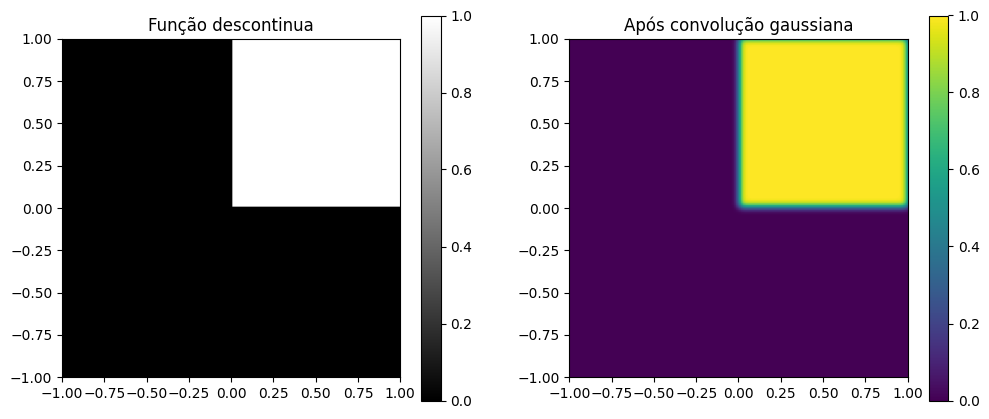

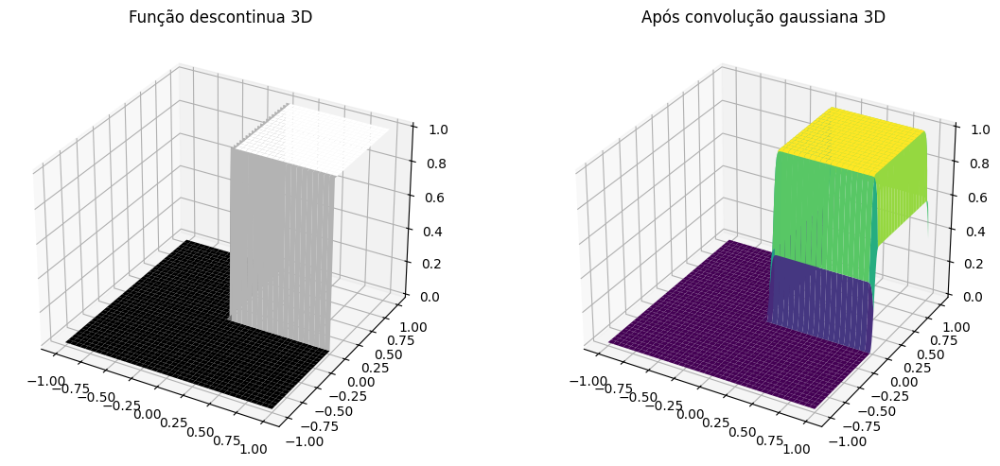

In [ ]:
#@title Convolução gaussiana, $\sigma=.2$.
# Kernel gaussiano
def gaussian_kernel(size, sigma):
    ax = np.linspace(-1, 1, size)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2)/(2*sigma**2))
    return kernel / np.sum(kernel)

kernel = gaussian_kernel(size=21, sigma=.2)

# Convolução 2D
f_smooth = convolve2d(f, kernel, mode='same', boundary='fill', fillvalue=0)

# Visualização 2D
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(f, extent=[-1,1,-1,1], origin='lower', cmap='gray')
plt.title("Função descontinua")
plt.colorbar()

plt.subplot(1,2,2)
plt.imshow(f_smooth, extent=[-1,1,-1,1], origin='lower', cmap='viridis')
plt.title("Após convolução gaussiana")
plt.colorbar()
plt.show()

# Visualização 3D
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,5))
ax1 = fig.add_subplot(1,2,1, projection='3d')
ax1.plot_surface(X, Y, f, cmap='gray', edgecolor='none')
ax1.set_title("Função descontinua 3D")

ax2 = fig.add_subplot(1,2,2, projection='3d')
ax2.plot_surface(X, Y, f_smooth, cmap='viridis', edgecolor='none')
ax2.set_title("Após convolução gaussiana 3D")

plt.tight_layout()
plt.show()

#**Filtro de sombra em imagem**

Cosidere a imagem como
$$
I(x,y) = R(x,y) \cdot L(x,y)
$$

onde $R(x,y)$ contém os detalhes da imagem, como bordas e texturas, e $L(x,y)$ representa variações lentas de luminosidade, sombras e reflexos (ver [6] e outros métodos para imagens em [12]).

O objetivo é estimar $L(x,y)$ para poder recuperar $R(x,y)$ e, assim, reduzir sombras e reflexos.

---

Estimativa do mapa de iluminação:

O mapa de iluminação deve ser suave, sem detalhes finos. Uma forma simples de obter isso é aplicar uma difusão gaussiana à imagem original:

$$
L(x,y) \approx I(x,y) * G_\sigma(x,y)
$$

onde $ * $ denota convolução 2D e $G_\sigma(x,y)$ é um kernel gaussiano com desvio padrão $\sigma$. Quanto maior $\sigma$, mais suave será a estimativa de $L(x,y)$.

---

Correção da imagem:

Após estimar o mapa de iluminação, a imagem corrigida é obtida por:

$$
u_{\text{corrigida}}(x,y) = \frac{I(x,y)}{L(x,y) + \epsilon}
$$

onde \(\epsilon > 0\) é um pequeno valor para evitar divisão por zero. Esta operação normaliza a iluminação, reduzindo sombras e reflexos, preserva bordas e texturas (que estão contidas em \(R(x,y)\)) e produz uma imagem com contraste mais uniforme.

---

Resumo do processo:

1. A imagem original $I(x,y)$ contém sombras e detalhes.  
2. Aplica-se difusão gaussiana para obter $L(x,y)$, mapa de iluminação suave.  
3. Divide-se a imagem original pelo mapa de iluminação: $R(x,y) = I(x,y)/L(x,y)$.  
4. Ajusta-se brilho/contraste se necessário.


Saving Amarilis.jpeg to Amarilis (3).jpeg
Imagem carregada como colorida. Processando cada canal separadamente.
Starting Gradient Descent for 450 iterations with alpha=0.1


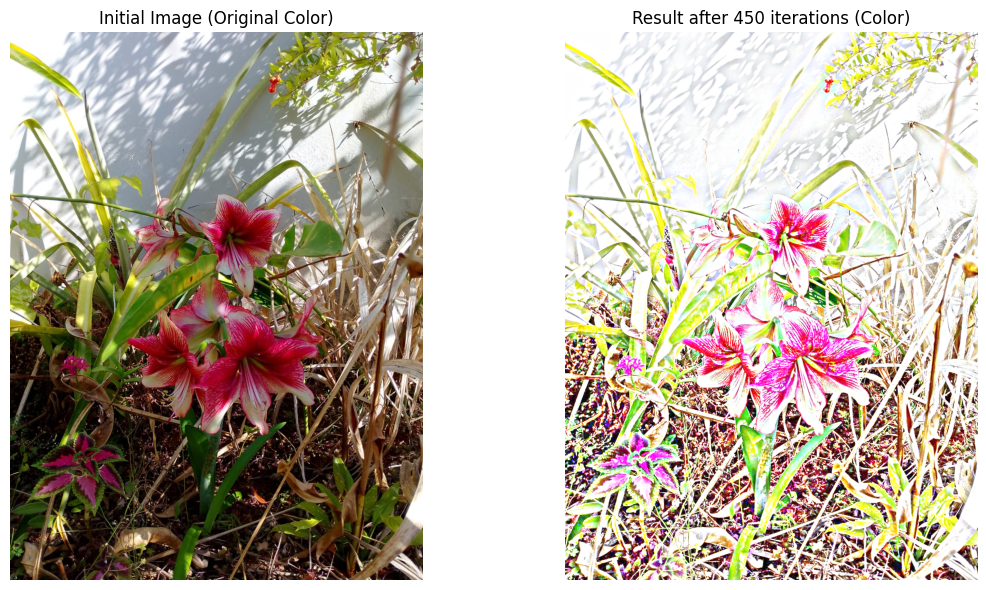

In [ ]:
#@title Gradiente descente
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import laplace
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import img_as_float
from google.colab import files

# Abrir seletor de arquivo
uploaded = files.upload()  # isso vai abrir a janela para você escolher a imagem

# Pegar o nome do arquivo enviado
image_name = list(uploaded.keys())[0]

# Read the image and convert to float for processing
img = imread(image_name)
img_float = img_as_float(img)

is_color = img_float.ndim == 3

if is_color:
    # If RGBA, take only the first 3 channels (RGB)
    if img_float.shape[-1] == 4:
        img_process = img_float[..., :3].copy()
    else:
        img_process = img_float.copy()
    print("Imagem carregada como colorida. Processando cada canal separadamente.")
    Ny, Nx, _ = img_process.shape # Get dimensions for color image
else:
    img_process = img_float.copy()
    print("Imagem carregada como grayscale.")
    Ny, Nx = img_process.shape # Get dimensions for grayscale image


# Gradient Descent parameters
alpha = 0.1  # Step size (learning rate) - acts as time step in heat equation
niter = 450 # Number of iterations

print(f"Starting Gradient Descent for {niter} iterations with alpha={alpha}")

if is_color:
    u_final_color = np.zeros_like(img_process)
    for channel in range(img_process.shape[-1]):
        u = img_process[..., channel].copy() # Initialize u with the current channel
        # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
        for i in range(niter):
            # Calculate the Laplacian of u
            delta_u = laplace(u)

            # Calculate the gradient of the functional: -Delta u
            gradient_J = -delta_u

            # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
            u = u - alpha * gradient_J

        u_final_color[..., channel] = u
    u_final = u_final_color
else:
    u = img_process.copy() # Initialize u with the grayscale image
    # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
    for i in range(niter):
        # Calculate the Laplacian of u
        delta_u = laplace(u)

        # Calculate the gradient of the functional: -Delta u
        gradient_J = -delta_u

        # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
        u = u - alpha * gradient_J
# --- Visualization ---

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
# Show the initial image (which is the initial u)
if is_color:
    plt.imshow(img_float) # Show original color image
    plt.title('Initial Image (Original Color)')
else:
    plt.imshow(img_float, cmap='gray')
    plt.title('Initial Image (Grayscale)')
plt.axis('off')

plt.subplot(1, 2, 2)
if is_color:
    # Clip values to [0, 1] before displaying color image
    u_final_display = np.clip(img_float/(u_final+1e-3), 0, 1)
    plt.imshow(u_final_display)
    plt.title(f"Result after {niter} iterations (Color)")
else:
    plt.imshow(u_final, cmap='gray')
    plt.title(f"Result after {niter} iterations (Grayscale)")
plt.axis('off')

plt.tight_layout()
plt.show()

# --- Save Resulting Image ---
# Optional: Add saving functionality if needed
# output_filename = f'gradient_descent_{niter}_{image_name}'
# u_to_save = (np.clip(u_final, 0, 1) * 255).astype(np.uint8)
# imsave(output_filename, u_to_save)
# print(f"Resulting image saved as '{output_filename}'")

Saving Amarilis.jpeg to Amarilis.jpeg
Imagem carregada como colorida (3D).


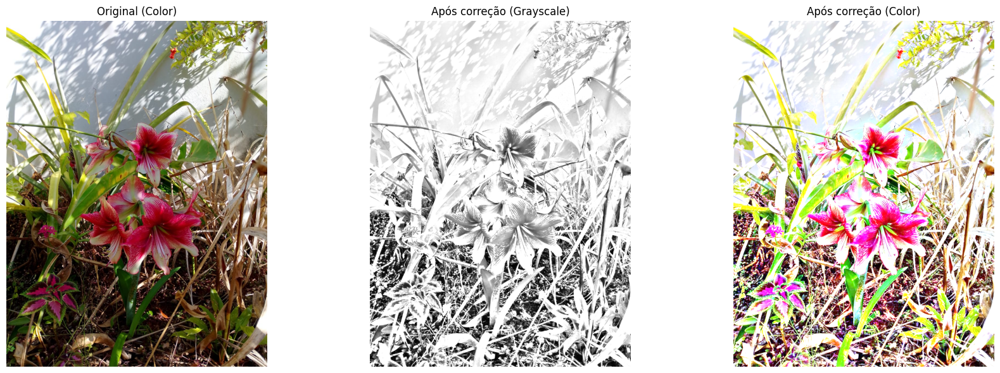

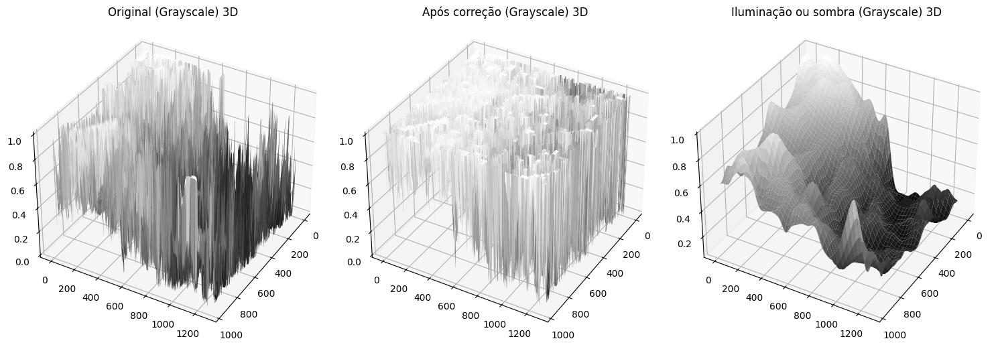

Imagem colorida corrigida salva como 'corrected_image.png'


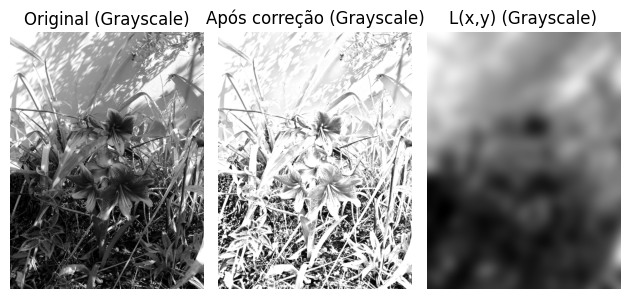

In [ ]:
#@title Exemplo filtro de iluminação
from google.colab import files
from skimage.io import imread, imsave
from skimage.color import rgb2gray
from skimage import img_as_float
from skimage.filters import gaussian # Import gaussian filter
from scipy.ndimage import laplace # Import laplace filter
import matplotlib.pyplot as plt
import numpy as np
import os # Import os module
from mpl_toolkits.mplot3d import Axes3D # Import 3D plotting toolkit

# Abrir seletor de arquivo
uploaded = files.upload()  # isso vai abrir a janela para você escolher a imagem

# Pegar o nome do arquivo enviado
image_name = list(uploaded.keys())[0]

# Read the image
img = imread(image_name)

# --- Processing ---

# Convert the image to float for calculations
img_float = img_as_float(img)

# Improved check for color image: 3D and last dimension is 3 or 4
is_color = (img_float.ndim == 3 and img_float.shape[-1] in (3, 4))

if not is_color:
    # Image is grayscale (2D) or 3D with unexpected channels, treat as grayscale
    if img_float.ndim == 3:
        # If 3D but not color, take the first channel as grayscale
        img_gray = img_float[..., 0]
        print("Imagem 3D com canais inesperados, tratando o primeiro canal como grayscale.")
    else:
        # Image is already 2D grayscale
        img_gray = img_float
        print("Imagem carregada como grayscale (2D).")

    img_color_corrected = None # No color correction possible for grayscale input

    # Estimate illumination for the grayscale image
    sigma = 30  # controls the smoothness of the illumination map
    epsilon = 1e-3
    illumination_gray = gaussian(img_gray, sigma=sigma)
    # Correct the grayscale image
    corrected_gray = img_gray / (illumination_gray + epsilon)
    corrected_gray = np.clip(corrected_gray, 0, 1)


else:
    # Image is color (3D with 3 or 4 channels)
    # If RGBA, take only the first 3 channels (RGB) for color processing
    if img_float.shape[-1] == 4:
        img_rgb = img_float[..., :3]
    else:
        img_rgb = img_float

    img_gray = rgb2gray(img_rgb) # Convert to grayscale for comparison and grayscale plots

    # Apply the illumination correction to each color channel
    corrected_channels = []
    sigma = 30  # controls the smoothness of the illumination map
    epsilon = 1e-3
    for channel in range(img_rgb.shape[-1]):
        # Estimate illumination for the current channel
        illumination_channel = gaussian(img_rgb[..., channel], sigma=sigma)
        # Correct the channel
        corrected_channel = img_rgb[..., channel] / (illumination_channel + epsilon)
        corrected_channels.append(corrected_channel)

    # Stack the corrected channels back into a color image
    img_color_corrected = np.stack(corrected_channels, axis=-1)
    img_color_corrected = np.clip(img_color_corrected, 0, 1) # Clip values to [0, 1]

    # Also calculate grayscale correction for comparison plot
    illumination_gray = gaussian(img_gray, sigma=sigma)
    corrected_gray = img_gray / (illumination_gray + epsilon)
    corrected_gray = np.clip(corrected_gray, 0, 1)

    print("Imagem carregada como colorida (3D).")


# --- Visualization (3D) ---

plt.figure(figsize=(18, 6))

# Original Image
plt.subplot(1, 3, 1)
if is_color:
     plt.imshow(img_rgb) # Show original color image
     plt.title('Original (Color)')
else:
     plt.imshow(img_gray, cmap='gray')
     plt.title('Original (Grayscale)')
plt.axis('off')


# Corrected Grayscale Image
plt.subplot(1, 3, 2)
plt.imshow(corrected_gray, cmap='gray')
plt.title('Após correção (Grayscale)')
plt.axis('off')


# Corrected Color Image (Show only if input was color)
plt.subplot(1, 3, 3)
if is_color:
    plt.imshow(img_color_corrected)
    plt.title('Após correção (Color)')
else:
    # If input was grayscale, plot the grayscale correction again
    plt.imshow(corrected_gray, cmap='gray')
    plt.title('Após correção (Grayscale)')
plt.axis('off')


plt.tight_layout()
plt.show()

# --- Visualization (3D) ---
# Create meshgrid based on the dimensions of the grayscale image
Ny_gray, Nx_gray = img_gray.shape
X, Y = np.meshgrid(np.arange(Nx_gray), np.arange(Ny_gray))


fig = plt.figure(figsize=(15,5))

# Original Grayscale 3D
ax1 = fig.add_subplot(1,3,1, projection='3d')
ax1.plot_surface(X, Y, img_gray, cmap='gray', edgecolor='none') # Use img_gray for Z
ax1.set_title("Original (Grayscale) 3D")
# Ajuste da câmera
ax1.view_init(elev=35, azim=30)
#ax1.set_axis_off()

# Corrected Grayscale 3D
ax2 = fig.add_subplot(1,3,2, projection='3d')
ax2.plot_surface(X, Y, corrected_gray, cmap='gray', edgecolor='none') # Use corrected_gray for Z
ax2.set_title("Após correção (Grayscale) 3D")
# Ajuste da câmera
ax2.view_init(elev=35, azim=30)
#ax2.set_axis_off()

# Ilimination 3D
ax3 = fig.add_subplot(1,3,3, projection='3d')
ax3.plot_surface(X, Y, illumination_gray, cmap='gray', edgecolor='none') # Use corrected_gray for Z
ax3.set_title("Iluminação ou sombra (Grayscale) 3D")
#ax2.set_axis_off()
plt.tight_layout()
# Ajuste da câmera
ax3.view_init(elev=35, azim=30)
plt.show()


# --- Save Corrected Image ---
output_filename = 'corrected_image.png' # Using a fixed filename for saving


if is_color:
    # Convert the float image (0-1 range) to uint8 (0-255 range) before saving
    # Ensure the image to save is 3 channels (RGB) if original was color
    if img_color_corrected.shape[-1] == 4: # If it was RGBA, convert to RGB for saving
         img_to_save = (img_color_corrected[..., :3] * 255).astype(np.uint8)
    else:
        img_to_save = (img_color_corrected * 255).astype(np.uint8)

    imsave(output_filename, img_to_save)
    print(f"Imagem colorida corrigida salva como '{output_filename}'")
else:
    # Convert the float image (0-1 range) to uint8 (0-255 range) before saving
    img_to_save = (corrected_gray * 255).astype(np.uint8)
    imsave(output_filename, img_to_save)
    print(f"Imagem grayscale corrigida salva como '{output_filename}'")



# Corrected Grayscale Image
plt.subplot(1, 3, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Original (Grayscale)')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(corrected_gray, cmap='gray')
plt.title('Após correção (Grayscale)')
plt.axis('off')


plt.subplot(1, 3, 3)
plt.imshow(illumination_gray, cmap='gray')
plt.title('L(x,y) (Grayscale)')
plt.axis('off')
plt.tight_layout()
plt.show()

Saving Amarilis.jpeg to Amarilis (5).jpeg
Imagem carregada como colorida. Processando cada canal separadamente.
Resolvendo a equação do calor por método espectral para t=450.00


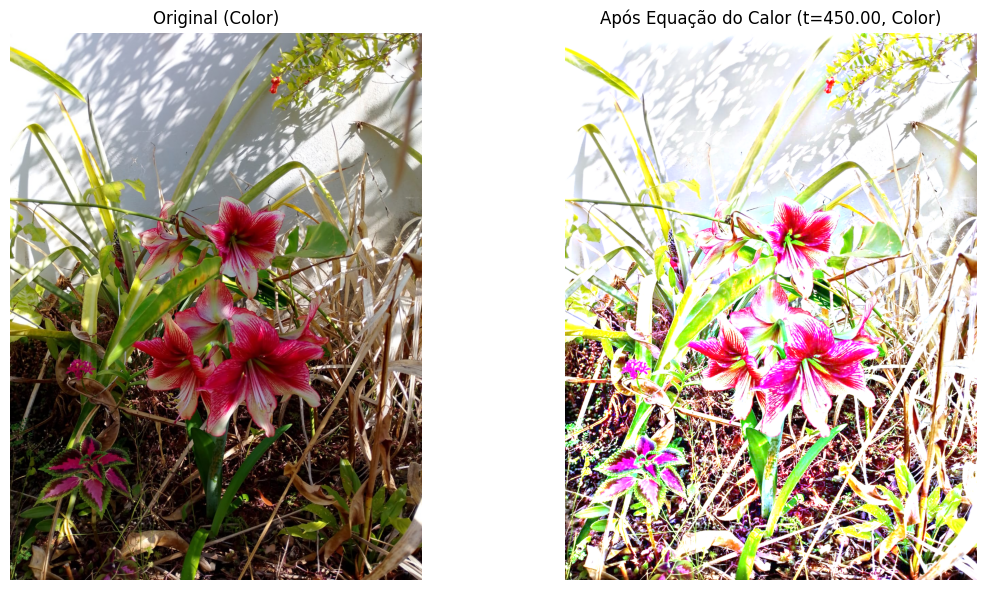

Imagem resultante da equação do calor (método espectral) salva como 'heat_equation_spectral_t450_Amarilis (5).jpeg'


In [ ]:
#@title Solução da Equação do Calor por Método Espectral
from google.colab import files
from skimage.io import imread, imsave
from skimage.color import rgb2gray
from skimage import img_as_float
# Removed laplace import as it's not needed for the spectral method
from scipy.fft import fft2, ifft2, fftfreq # Import FFT functions
import matplotlib.pyplot as plt
import numpy as np
import os # Import os module

# Abrir seletor de arquivo
uploaded = files.upload()  # isso vai abrir a janela para você escolher a imagem

# Pegar o nome do arquivo enviado
image_name = list(uploaded.keys())[0]

# Read the image
img = imread(image_name)

# --- Processing ---

# Convert the image to float for calculations
img_float = img_as_float(img)

is_color = img_float.ndim == 3

if is_color:
    # If RGBA, take only the first 3 channels (RGB)
    if img_float.shape[-1] == 4:
        img_process = img_float[..., :3].copy()
    else:
        img_process = img_float.copy()
    print("Imagem carregada como colorida. Processando cada canal separadamente.")
    Ny, Nx, _ = img_process.shape # Get dimensions for color image
else:
    img_process = img_float.copy()
    print("Imagem carregada como grayscale.")
    Ny, Nx = img_process.shape # Get dimensions for grayscale image


# --- Solve Heat Equation using Spectral Method ---
T_final = 450.0 #@param {type:"slider", min:1, max:200, step:1} # Final time

print(f"Resolvendo a equação do calor por método espectral para t={T_final:.2f}")

# Calculate spatial frequencies
# The frequency components kx, ky are defined for a grid with unit spacing (implicitly pixels)
kx = 2 * np.pi * fftfreq(Nx)
ky = 2 * np.pi * fftfreq(Ny)
Kx, Ky = np.meshgrid(kx, ky)

# Calculate the squared magnitude of the wave vector in the frequency domain
K_squared = Kx**2 + Ky**2

# Calculate the spectral filter (exponential decay) for the final time T_final
spectral_filter = np.exp(-K_squared * T_final)

if is_color:
    u_final_color = np.zeros_like(img_process)
    for channel in range(img_process.shape[-1]):
        # Take FFT of the initial image channel
        u_hat_initial = fft2(img_process[..., channel])

        # Apply the spectral filter in the frequency domain
        u_hat_final = u_hat_initial * spectral_filter

        # Take the inverse FFT to get the solution in the spatial domain
        u_final_color[..., channel] = ifft2(u_hat_final).real
    u_final = u_final_color
else:
    # Take FFT of the initial grayscale image
    u_hat_initial = fft2(img_process)

    # Apply the spectral filter in the frequency domain
    u_hat_final = u_hat_initial * spectral_filter

    # Take the inverse FFT to get the solution in the spatial domain
    u_final = ifft2(u_hat_final).real


# --- Visualization ---

plt.figure(figsize=(12, 6))

# Original Image
plt.subplot(1, 2, 1)
if is_color:
     plt.imshow(img_float) # Show original color image
     plt.title('Original (Color)')
else:
     plt.imshow(img_float, cmap='gray')
     plt.title('Original (Grayscale)')
plt.axis('off')

# Result after solving Heat Equation
plt.subplot(1, 2, 2)
if is_color:
    # Clip values to [0, 1] before displaying color image
    u_final_display = np.clip(img_float/(u_final+1e-3), 0, 1)
    plt.imshow(u_final_display)
    plt.title(f'Após Equação do Calor (t={T_final:.2f}, Color)')
else:
    plt.imshow(u_final, cmap='gray')
    plt.title(f'Após Equação do Calor (t={T_final:.2f}, Grayscale)')
plt.axis('off')

plt.tight_layout()
plt.show()

# --- Save Resulting Image ---
output_filename = f'heat_equation_spectral_t{T_final:.0f}_{image_name}'

# Convert the float image to uint8 (0-255 range) before saving
u_to_save = (np.clip(u_final, 0, 1) * 255).astype(np.uint8)
imsave(output_filename, u_to_save)
print(f"Imagem resultante da equação do calor (método espectral) salva como '{output_filename}'")

Uma imagem colorida pode ser vista como uma matriz tridimensional $A_{m\times n\times 3}$, ou como três matrizes $R_{m\times n}$ (Red), $G_{m\times n}$ (Green) e $B_{m\times n}$ (Blue), que contêm números entre 0 e 255, os quais representam a intensidade das cores vermelho, verde e azul em cada píxel da imagem. As imagens em escala de cinza podem ser representadas por uma matriz e, neste caso, 0 indica que o píxel correspondente tem cor preta e 255 indica a cor branca.
Veja, por exemplo, o texto de divulgação matemática ([2]) para um tratamento envolvendo Álgebra Linear.

Para cada cor, consideramos uma imagem como uma função
$$
I(x,y) = R(x,y) \cdot L(x,y),
$$
em que $R(x,y)$ contém os detalhes da imagem, como bordas e texturas, e $L(x,y)$ contém as variações lentas de luminosidade, sombras e reflexos. No caso da imagem da foto do Amarilis (esquerda) queremos estimar $L(x,y)$ para poder reduzir sombras. Uma forma de olhar para o problema é supor que a iluminação $L(x,y)$ é uma função suave e sem variações rápidas. Então o gradiente $\nabla L(x,y)$ varia de forma contínua no espaço e deve ser pequeno na maior parte do domínio porque não há saltos ou mudanças abruptas na imagem de $L$. As regiões em que $L(x,y)$ é constante ou quase constante terão gradiente próximo de zero. Por isso, buscamos aproximar $L(x,y)$ por meio de um processo de difusão, ao minimizar o funcional $$J(u)=\frac{1}{2}\int_{R^2}\|\nabla u(x,y)\|^2dxdy$$
por meio do método dos gradientes, dado por $$\begin{cases} \frac{\partial u}{\partial t}(x,y,t)&=-\nabla J (u)(x,t)\\ u(x,y,0)&=I(x,y)\end{cases}$$
o que equivale a resolver a equação do calor
$$
\frac{\partial u}{\partial t}(x,y,t)=\Delta u(x,y,t),\qquad u(x,y,0)=I(x,y),
$$ em que o gradiente $\nabla$ e o laplaciano $\Delta$ atuam apenas na variável $(x,y)$, porque $-\nabla J (u)=\Delta u$, neste caso ([1,4,10]). A solução dessa equação é dada por meio da convolução $$
u(\cdot,\cdot,t) = G_{\sigma} * I\approx L(\cdot,\cdot),
$$ com $
\sigma = \sqrt{2t}$ grande e o núcleo gaussiano $$
G_\sigma(x,y) = \frac{1}{2\pi \sigma^2} \exp\!\Bigl(-\frac{x^2 + y^2}{2 \sigma^2}\Bigr).
$$
%Consideramos $\sigma>0$ e tomamos $$L(x,y) \approx G_\sigma(x,y)*I(x,y). $$  

Quanto maior for $t$ (ou $\sigma$), mais suave será a estimativa de $L(x,y)$ e, depois que estimarmos a função $L(x,y)$, a imagem corrigida é obtida como
$$
R(x,y)\approx u_{\text{novo}}(x,y) = \frac{I(x,y)}{L(x,y) + \epsilon}
$$
sendo $\epsilon > 0$ pequeno, para evitar divisão por zero, na busca por reduzir sombras e reflexos e preservar bordas e texturas (que estão contidas em $R(x,y)$). No caso da imagem da foto do Amarilis, $t=0$ indica a imagem com sombra e $\sigma = \sqrt{2t}=30$ indica a imagem à direita e o processo de resolução utilizou aproximações numéricas.

A solução do problema inicial da equação do calor em $\mathbb{R}^2$,

$$
\frac{\partial u}{\partial t}(x,y,t) = \Delta u(x,y,t), \qquad u(x,y,0)=I(x,y),
$$

é dada por

$$
u(x,y,t)
= \iint_{\mathbb{R}^2} H_t(x-\xi, y-\eta)\; I(\xi,\eta)\, d\xi\, d\eta,
$$

onde o núcleo de calor $H_t$ em duas dimensões é

$$
H_t(x,y) = \frac{1}{4\pi t} \exp\!\Bigl(-\frac{x^2 + y^2}{4t}\Bigr).
$$

Dessa forma:

$$
u(x,y,t) = \iint_{\mathbb{R}^2} \frac{1}{4\pi t} \exp\!\Bigl(-\frac{(x-\xi)^2 + (y-\eta)^2}{4t}\Bigr)\; I(\xi,\eta)\, d\xi\, d\eta.
$$

---

Interpretação como suavização (filtro gaussiano):

Convolução com um kernel gaussiano:

$$
G_\sigma(x,y) = \frac{1}{2\pi \sigma^2} \exp\!\Bigl(-\frac{x^2 + y^2}{2 \sigma^2}\Bigr),
$$

sendo que

$$
\sigma = \sqrt{2t}
$$

faz com que

$$
u(\cdot,\cdot,t) = G_{\sigma} * I.
$$

---

Derivação pela transformada de Fourier (esboço):

Aplicando a transformada espacial em $(x,y)$ obtemos para cada frequência $\mathbf{k}$:

$$
\partial_t \widehat{u}(\mathbf{k},t) = -|\mathbf{k}|^2 \widehat{u}(\mathbf{k},t), \quad \widehat{u}(\mathbf{k},0) = \widehat{I}(\mathbf{k}),
$$

cuja solução é

$$
\widehat{u}(\mathbf{k},t) = e^{-|\mathbf{k}|^2 t} \,\widehat{I}(\mathbf{k}).
$$

Voltando ao espaço físico por transformada inversa, chega-se à expressão integral acima com o kernel gaussiano.

---

Observações:

1. A fórmula dada é para o domínio $\mathbb{R}^2$. Em domínios limitados, com condições de contorno (Dirichlet, Neumann, etc.), a solução envolve autofunções do Laplaciano.  
2. Para qualquer $t>0$, a solução $u(x,y,t)$ é instantaneamente $C^\infty$, ou seja, suaviza o dado inicial $I(x,y)$.  
3. A magnitude do gradiente de $u(\cdot,\cdot,t)$ tende a diminuir conforme $t$ aumenta, visto que as altas frequências são atenuadas mais fortemente.


Saving Amarilis.jpeg to Amarilis.jpeg
Imagem carregada como colorida. Processando cada canal separadamente.
Starting Gradient Descent for 45 iterations with alpha=0.1


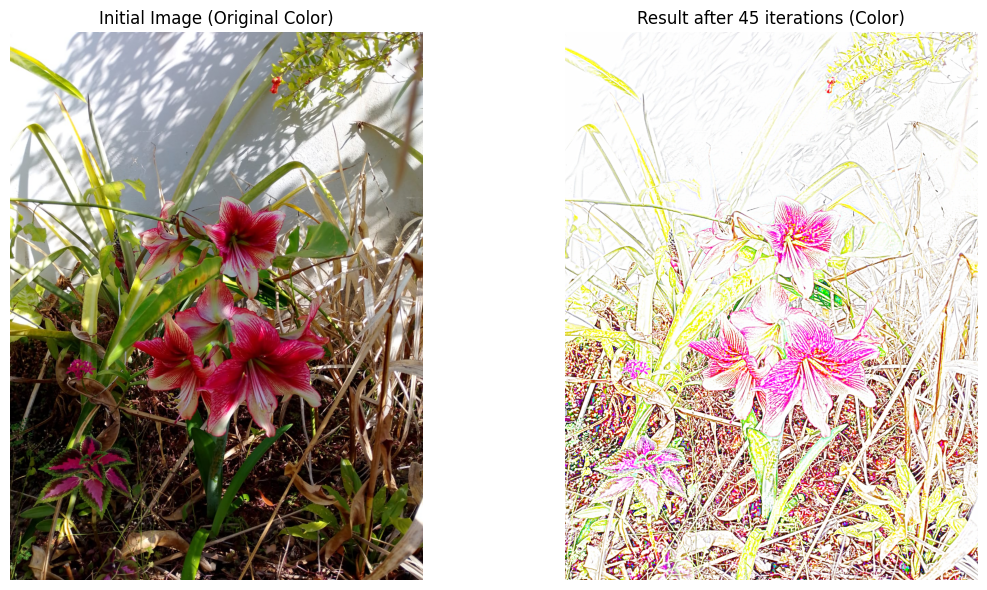

In [ ]:
#@title Gradiente descente
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import laplace
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import img_as_float
from google.colab import files

# Abrir seletor de arquivo
uploaded = files.upload()  # isso vai abrir a janela para você escolher a imagem

# Pegar o nome do arquivo enviado
image_name = list(uploaded.keys())[0]

# Read the image and convert to float for processing
img = imread(image_name)
img_float = img_as_float(img)

is_color = img_float.ndim == 3

if is_color:
    # If RGBA, take only the first 3 channels (RGB)
    if img_float.shape[-1] == 4:
        img_process = img_float[..., :3].copy()
    else:
        img_process = img_float.copy()
    print("Imagem carregada como colorida. Processando cada canal separadamente.")
    Ny, Nx, _ = img_process.shape # Get dimensions for color image
else:
    img_process = img_float.copy()
    print("Imagem carregada como grayscale.")
    Ny, Nx = img_process.shape # Get dimensions for grayscale image


# Gradient Descent parameters
alpha = 0.1  # Step size (learning rate) - acts as time step in heat equation
niter = 45 # Number of iterations

print(f"Starting Gradient Descent for {niter} iterations with alpha={alpha}")

if is_color:
    u_final_color = np.zeros_like(img_process)
    for channel in range(img_process.shape[-1]):
        u = img_process[..., channel].copy() # Initialize u with the current channel
        # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
        for i in range(niter):
            # Calculate the Laplacian of u
            delta_u = laplace(u)

            # Calculate the gradient of the functional: -Delta u
            gradient_J = -delta_u

            # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
            u = u - alpha * gradient_J

        u_final_color[..., channel] = u
    u_final = u_final_color
else:
    u = img_process.copy() # Initialize u with the grayscale image
    # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
    for i in range(niter):
        # Calculate the Laplacian of u
        delta_u = laplace(u)

        # Calculate the gradient of the functional: -Delta u
        gradient_J = -delta_u

        # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
        u = u - alpha * gradient_J
# --- Visualization ---

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
# Show the initial image (which is the initial u)
if is_color:
    plt.imshow(img_float) # Show original color image
    plt.title('Initial Image (Original Color)')
else:
    plt.imshow(img_float, cmap='gray')
    plt.title('Initial Image (Grayscale)')
plt.axis('off')

plt.subplot(1, 2, 2)
if is_color:
    # Clip values to [0, 1] before displaying color image
    u_final_display = np.clip(img_float/(u_final+1e-3), 0, 1)
    plt.imshow(u_final_display)
    plt.title(f"Result after {niter} iterations (Color)")
else:
    plt.imshow(u_final, cmap='gray')
    plt.title(f"Result after {niter} iterations (Grayscale)")
plt.axis('off')

plt.tight_layout()
plt.show()

# --- Save Resulting Image ---
# Optional: Add saving functionality if needed
# output_filename = f'gradient_descent_{niter}_{image_name}'
# u_to_save = (np.clip(u_final, 0, 1) * 255).astype(np.uint8)
# imsave(output_filename, u_to_save)
# print(f"Resulting image saved as '{output_filename}'")

#**Outras possibilidades**

Se considerarmos agora a imagem bidimensional
$$
u(x,y) = f_0(x,y) + \eta(x,y),
$$
onde $f_0$ é a imagem original desconhecida e $\eta$ representa ruído aditivo.
Um objetivo de um método de filtragem é obter uma aproximação
$$
f(x,y) \approx f_0(x,y).
$$

O funcional a ser minimizado é
$$
J(f) = \frac{1}{2}\left( \|f-u\|_{L^2(\mathbb{R}^2)}^2
+ \lambda \|\nabla f\|_{L^2(\mathbb{R}^2)}^2 \right)
$$ seguuindo na direção do gradiente de $J(u)$ e iniciando em $I(x,y)$ que é a imangem dada.
isto é, queremos encontrar uma função suave $f(x,y)$, ou seja, com $\|\nabla f(x,y)\|$ pequeno e que não esteja muito distante de $u$, ou seja, tal que $\|f-u\|\approx\|\eta\|$ não seja muito grande. Aqui $\lambda>0$ controla o balanço entre fidelidade aos dados e suavidade imposta.

Algumas variações disso podem ser vistas em [12].

Aqui vamos olhar para imagens que obtemos quando consideramos que
$$
u(x,y) = f_0(x,y) + \eta(x,y),
$$
onde $f_0$ é a contem borda da imagem original e $\eta$ representa outros detalhes aditivos.
O objetivo de um método de filtragem é obter uma aproximação
$$
f(x,y) \approx f_0(x,y)
$$
a partir da imagem dada. Para isso usamos o método dos gradiente no funcional $$
J(f) =\frac{1}{2}\left( \lambda \|\nabla f\|_{L^2(\mathbb{R}^2)}^2 - \|f-u\|_{L^2(\mathbb{R}^2)}^2\right).
$$
Como $$
2J(f+h) = -\left(\langle f +h- u, f+h-u\rangle+ \lambda \langle f'+h',f'+h'\rangle\right)=-\left(\langle f - u, f-u\rangle+2\langle f - u, h\rangle+\langle h, h\rangle\right)+ \lambda\left( \langle f',f'\rangle+ 2\langle f',h'\rangle+ \langle h',h'\rangle\right),$$ o temos que $$J'(f)\cdot h=\nabla J(f)\cdot h=-\langle f - u, h\rangle+\lambda \langle f',h'\rangle.$$ Considerando $h$ de suporte compacto (que seja nula na fronteira do domínio), obtemos $$\nabla J(f)=u-f-\lambda\Delta f=0, $$ ou $$(I+\lambda \Delta)f=u,$$ no ponto de mínimo de $J(f)$.

Saving Amarilis.jpeg to Amarilis.jpeg
Imagem carregada como colorida. Processando cada canal separadamente.
Starting Gradient Descent for 45 iterations with alpha=0.1


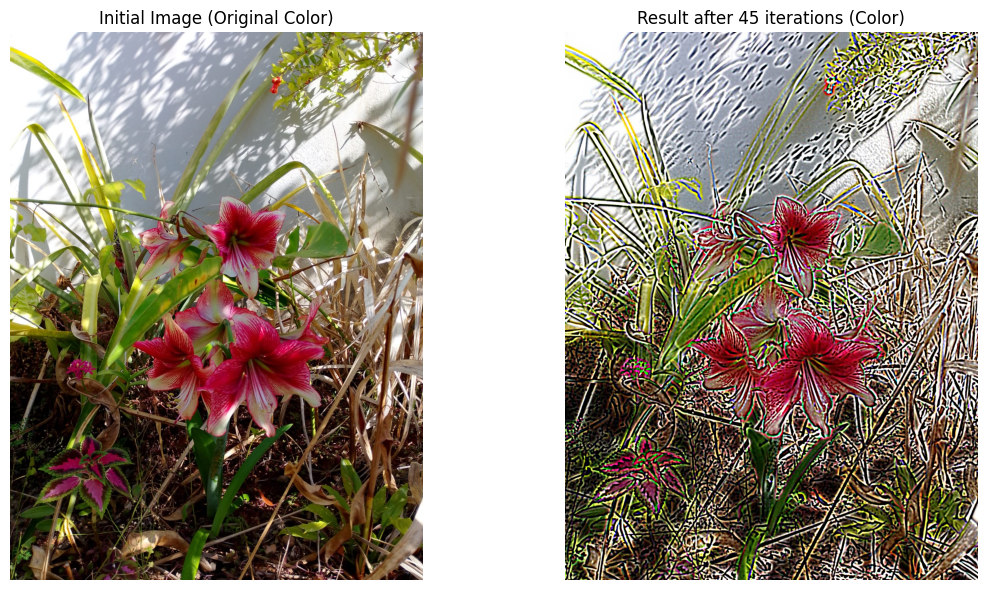

In [1]:
#@title Gradiente descente.
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import laplace
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import img_as_float
from google.colab import files

# Abrir seletor de arquivo
uploaded = files.upload()  # isso vai abrir a janela para você escolher a imagem

# Pegar o nome do arquivo enviado
image_name = list(uploaded.keys())[0]

# Read the image and convert to float for processing
img = imread(image_name)
img_float = img_as_float(img)

is_color = img_float.ndim == 3

if is_color:
    # If RGBA, take only the first 3 channels (RGB)
    if img_float.shape[-1] == 4:
        img_process = img_float[..., :3].copy()
    else:
        img_process = img_float.copy()
    print("Imagem carregada como colorida. Processando cada canal separadamente.")
    Ny, Nx, _ = img_process.shape # Get dimensions for color image
else:
    img_process = img_float.copy()
    print("Imagem carregada como grayscale.")
    Ny, Nx = img_process.shape # Get dimensions for grayscale image


# Gradient Descent parameters
alpha = 0.1  # Step size (learning rate) - acts as time step in heat equation
niter = 45 # Number of iterations

print(f"Starting Gradient Descent for {niter} iterations with alpha={alpha}")

if is_color:
    u_final_color = np.zeros_like(img_process)
    for channel in range(img_process.shape[-1]):
        u = img_process[..., channel].copy() # Initialize u with the current channel
        # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
        for i in range(niter):
            # Calculate the Laplacian of u
            delta_u = laplace(u)

            # Calculate the gradient of the functional: -Delta u
            gradient_J = -delta_u-u+img_process[..., channel].copy()

            # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
            u = u - alpha * gradient_J

        u_final_color[..., channel] = u
    u_final = u_final_color
else:
    u = img_process.copy() # Initialize u with the grayscale image
    # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
    for i in range(niter):
        # Calculate the Laplacian of u
        delta_u = laplace(u)

        # Calculate the gradient of the functional: -Delta u
        gradient_J = -delta_u-u+img_process.copy()

        # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
        u = u - alpha * gradient_J
    u_final=u
# --- Visualization ---

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
# Show the initial image (which is the initial u)
if is_color:
    plt.imshow(img_float) # Show original color image
    plt.title('Initial Image (Original Color)')
else:
    plt.imshow(img_float, cmap='gray')
    plt.title('Initial Image (Grayscale)')
plt.axis('off')

plt.subplot(1, 2, 2)
if is_color:
    # Clip values to [0, 1] before displaying color image
    u_final_display = np.clip(u_final, 0, 1)
    plt.imshow(u_final_display)
    plt.title(f"Result after {niter} iterations (Color)")
else:
    plt.imshow(u_final, cmap='gray')
    plt.title(f"Result after {niter} iterations (Grayscale)")
plt.axis('off')

plt.tight_layout()
plt.show()

# --- Save Resulting Image ---
# Optional: Add saving functionality if needed
# output_filename = f'gradient_descent_{niter}_{image_name}'
# u_to_save = (np.clip(u_final, 0, 1) * 255).astype(np.uint8)
# imsave(output_filename, u_to_save)
# print(f"Resulting image saved as '{output_filename}'")

Saving Amarilis.jpeg to Amarilis (1).jpeg
Imagem carregada como colorida. Processando cada canal separadamente.
Starting Gradient Descent for 150 iterations with alpha=0.1


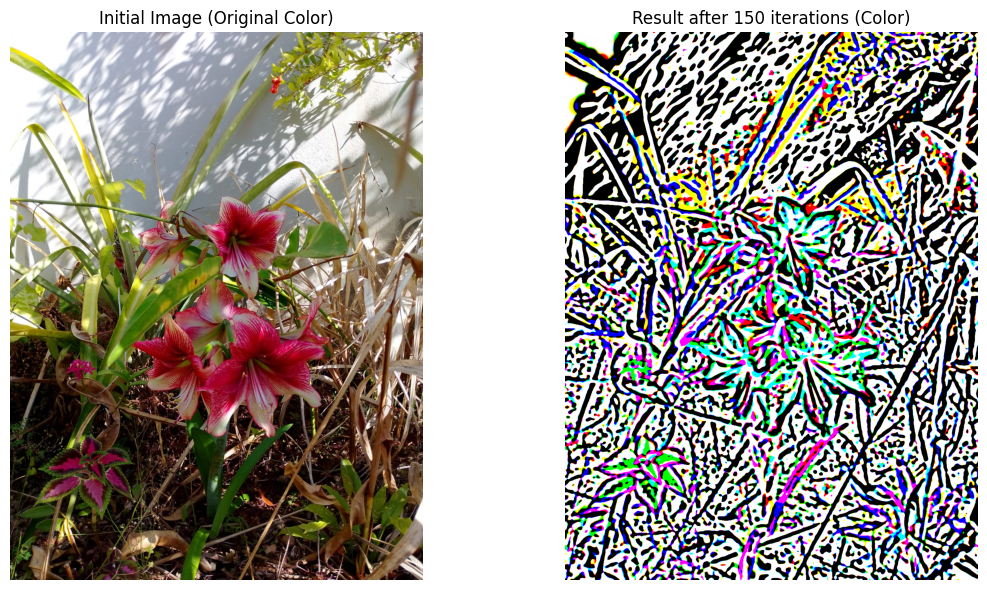

In [2]:
#@title Gradiente descente.
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import laplace
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import img_as_float
from google.colab import files

# Abrir seletor de arquivo
uploaded = files.upload()  # isso vai abrir a janela para você escolher a imagem

# Pegar o nome do arquivo enviado
image_name = list(uploaded.keys())[0]

# Read the image and convert to float for processing
img = imread(image_name)
img_float = img_as_float(img)

is_color = img_float.ndim == 3

if is_color:
    # If RGBA, take only the first 3 channels (RGB)
    if img_float.shape[-1] == 4:
        img_process = img_float[..., :3].copy()
    else:
        img_process = img_float.copy()
    print("Imagem carregada como colorida. Processando cada canal separadamente.")
    Ny, Nx, _ = img_process.shape # Get dimensions for color image
else:
    img_process = img_float.copy()
    print("Imagem carregada como grayscale.")
    Ny, Nx = img_process.shape # Get dimensions for grayscale image


# Gradient Descent parameters
alpha = 0.1  # Step size (learning rate) - acts as time step in heat equation
niter = 150 # Number of iterations

print(f"Starting Gradient Descent for {niter} iterations with alpha={alpha}")

if is_color:
    u_final_color = np.zeros_like(img_process)
    for channel in range(img_process.shape[-1]):
        u = img_process[..., channel].copy() # Initialize u with the current channel
        # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
        for i in range(niter):
            # Calculate the Laplacian of u
            delta_u = laplace(u)

            # Calculate the gradient of the functional: -Delta u
            gradient_J = -delta_u-u+img_process[..., channel].copy()

            # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
            u = u - alpha * gradient_J

        u_final_color[..., channel] = u
    u_final = u_final_color
else:
    u = img_process.copy() # Initialize u with the grayscale image
    # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
    for i in range(niter):
        # Calculate the Laplacian of u
        delta_u = laplace(u)

        # Calculate the gradient of the functional: -Delta u
        gradient_J = -delta_u-u+img_process.copy()

        # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
        u = u - alpha * gradient_J
    u_final=u
# --- Visualization ---

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
# Show the initial image (which is the initial u)
if is_color:
    plt.imshow(img_float) # Show original color image
    plt.title('Initial Image (Original Color)')
else:
    plt.imshow(img_float, cmap='gray')
    plt.title('Initial Image (Grayscale)')
plt.axis('off')

plt.subplot(1, 2, 2)
if is_color:
    # Clip values to [0, 1] before displaying color image
    u_final_display = np.clip(u_final, 0, 1)
    plt.imshow(u_final_display)
    plt.title(f"Result after {niter} iterations (Color)")
else:
    plt.imshow(u_final, cmap='gray')
    plt.title(f"Result after {niter} iterations (Grayscale)")
plt.axis('off')

plt.tight_layout()
plt.show()

# --- Save Resulting Image ---
# Optional: Add saving functionality if needed
# output_filename = f'gradient_descent_{niter}_{image_name}'
# u_to_save = (np.clip(u_final, 0, 1) * 255).astype(np.uint8)
# imsave(output_filename, u_to_save)
# print(f"Resulting image saved as '{output_filename}'")

Saving Amarilis.jpeg to Amarilis (2).jpeg
Imagem carregada como colorida. Processando cada canal separadamente.
Starting Gradient Descent for 600 iterations with alpha=0.1


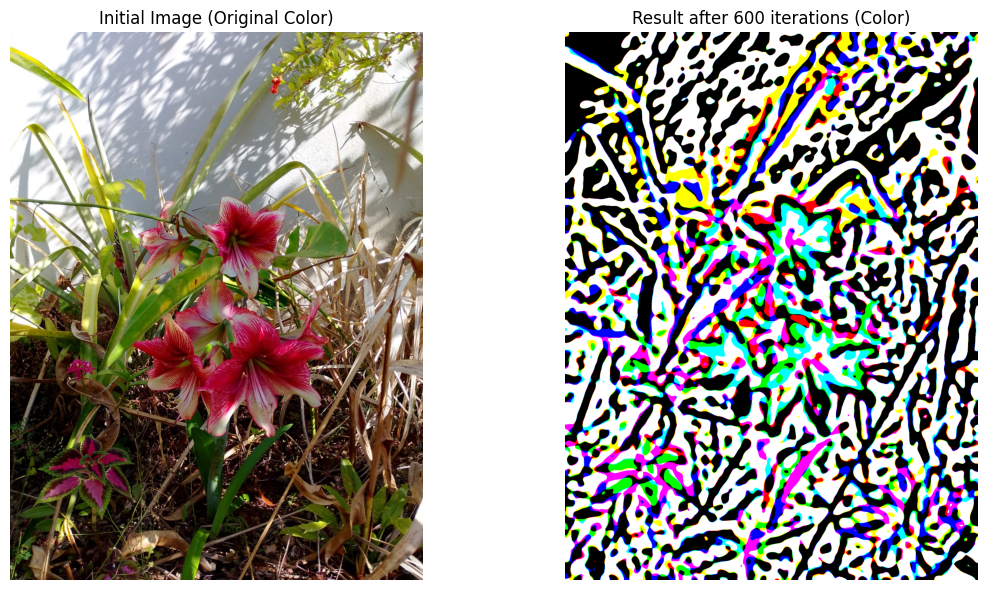

In [3]:
#@title Gradiente descente.
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import laplace
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import img_as_float
from google.colab import files

# Abrir seletor de arquivo
uploaded = files.upload()  # isso vai abrir a janela para você escolher a imagem

# Pegar o nome do arquivo enviado
image_name = list(uploaded.keys())[0]

# Read the image and convert to float for processing
img = imread(image_name)
img_float = img_as_float(img)

is_color = img_float.ndim == 3

if is_color:
    # If RGBA, take only the first 3 channels (RGB)
    if img_float.shape[-1] == 4:
        img_process = img_float[..., :3].copy()
    else:
        img_process = img_float.copy()
    print("Imagem carregada como colorida. Processando cada canal separadamente.")
    Ny, Nx, _ = img_process.shape # Get dimensions for color image
else:
    img_process = img_float.copy()
    print("Imagem carregada como grayscale.")
    Ny, Nx = img_process.shape # Get dimensions for grayscale image


# Gradient Descent parameters
alpha = 0.1  # Step size (learning rate) - acts as time step in heat equation
niter = 600 # Number of iterations

print(f"Starting Gradient Descent for {niter} iterations with alpha={alpha}")

if is_color:
    u_final_color = np.zeros_like(img_process)
    for channel in range(img_process.shape[-1]):
        u = img_process[..., channel].copy() # Initialize u with the current channel
        # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
        for i in range(niter):
            # Calculate the Laplacian of u
            delta_u = laplace(u)

            # Calculate the gradient of the functional: -Delta u
            gradient_J = -delta_u-u+img_process[..., channel].copy()

            # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
            u = u - alpha * gradient_J

        u_final_color[..., channel] = u
    u_final = u_final_color
else:
    u = img_process.copy() # Initialize u with the grayscale image
    # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
    for i in range(niter):
        # Calculate the Laplacian of u
        delta_u = laplace(u)

        # Calculate the gradient of the functional: -Delta u
        gradient_J = -delta_u-u+img_process.copy()

        # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
        u = u - alpha * gradient_J
    u_final=u
# --- Visualization ---

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
# Show the initial image (which is the initial u)
if is_color:
    plt.imshow(img_float) # Show original color image
    plt.title('Initial Image (Original Color)')
else:
    plt.imshow(img_float, cmap='gray')
    plt.title('Initial Image (Grayscale)')
plt.axis('off')

plt.subplot(1, 2, 2)
if is_color:
    # Clip values to [0, 1] before displaying color image
    u_final_display = np.clip(u_final, 0, 1)
    plt.imshow(u_final_display)
    plt.title(f"Result after {niter} iterations (Color)")
else:
    plt.imshow(u_final, cmap='gray')
    plt.title(f"Result after {niter} iterations (Grayscale)")
plt.axis('off')

plt.tight_layout()
plt.show()

# --- Save Resulting Image ---
# Optional: Add saving functionality if needed
# output_filename = f'gradient_descent_{niter}_{image_name}'
# u_to_save = (np.clip(u_final, 0, 1) * 255).astype(np.uint8)
# imsave(output_filename, u_to_save)
# print(f"Resulting image saved as '{output_filename}'")

Saving Amarilis.jpeg to Amarilis (3).jpeg
Imagem carregada como colorida. Processando cada canal separadamente.
Starting Gradient Descent for 1000 iterations with alpha=0.1


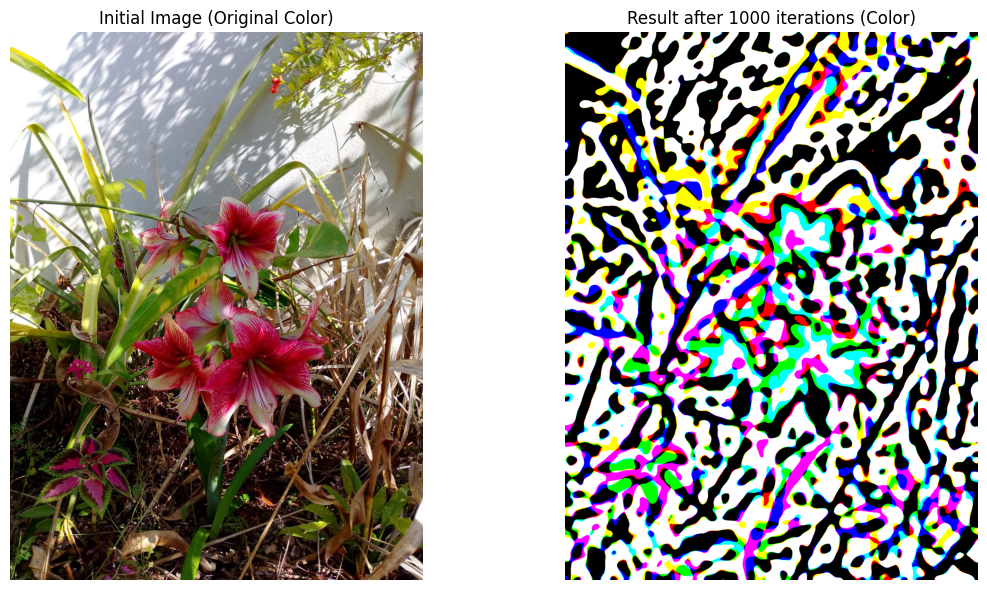

In [4]:
#@title Gradiente descente.
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import laplace
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import img_as_float
from google.colab import files

# Abrir seletor de arquivo
uploaded = files.upload()  # isso vai abrir a janela para você escolher a imagem

# Pegar o nome do arquivo enviado
image_name = list(uploaded.keys())[0]

# Read the image and convert to float for processing
img = imread(image_name)
img_float = img_as_float(img)

is_color = img_float.ndim == 3

if is_color:
    # If RGBA, take only the first 3 channels (RGB)
    if img_float.shape[-1] == 4:
        img_process = img_float[..., :3].copy()
    else:
        img_process = img_float.copy()
    print("Imagem carregada como colorida. Processando cada canal separadamente.")
    Ny, Nx, _ = img_process.shape # Get dimensions for color image
else:
    img_process = img_float.copy()
    print("Imagem carregada como grayscale.")
    Ny, Nx = img_process.shape # Get dimensions for grayscale image


# Gradient Descent parameters
alpha = 0.1  # Step size (learning rate) - acts as time step in heat equation
niter = 1000 # Number of iterations

print(f"Starting Gradient Descent for {niter} iterations with alpha={alpha}")

if is_color:
    u_final_color = np.zeros_like(img_process)
    for channel in range(img_process.shape[-1]):
        u = img_process[..., channel].copy() # Initialize u with the current channel
        # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
        for i in range(niter):
            # Calculate the Laplacian of u
            delta_u = laplace(u)

            # Calculate the gradient of the functional: -Delta u
            gradient_J = -delta_u-u+img_process[..., channel].copy()

            # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
            u = u - alpha * gradient_J

        u_final_color[..., channel] = u
    u_final = u_final_color
else:
    u = img_process.copy() # Initialize u with the grayscale image
    # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
    for i in range(niter):
        # Calculate the Laplacian of u
        delta_u = laplace(u)

        # Calculate the gradient of the functional: -Delta u
        gradient_J = -delta_u-u+img_process.copy()

        # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
        u = u - alpha * gradient_J
    u_final=u
# --- Visualization ---

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
# Show the initial image (which is the initial u)
if is_color:
    plt.imshow(img_float) # Show original color image
    plt.title('Initial Image (Original Color)')
else:
    plt.imshow(img_float, cmap='gray')
    plt.title('Initial Image (Grayscale)')
plt.axis('off')

plt.subplot(1, 2, 2)
if is_color:
    # Clip values to [0, 1] before displaying color image
    u_final_display = np.clip(u_final, 0, 1)
    plt.imshow(u_final_display)
    plt.title(f"Result after {niter} iterations (Color)")
else:
    plt.imshow(u_final, cmap='gray')
    plt.title(f"Result after {niter} iterations (Grayscale)")
plt.axis('off')

plt.tight_layout()
plt.show()

# --- Save Resulting Image ---
# Optional: Add saving functionality if needed
# output_filename = f'gradient_descent_{niter}_{image_name}'
# u_to_save = (np.clip(u_final, 0, 1) * 255).astype(np.uint8)
# imsave(output_filename, u_to_save)
# print(f"Resulting image saved as '{output_filename}'")

Saving Amarilis.jpeg to Amarilis (4).jpeg
Imagem carregada como colorida. Processando cada canal separadamente.
Starting Gradient Descent for 2000 iterations with alpha=0.1


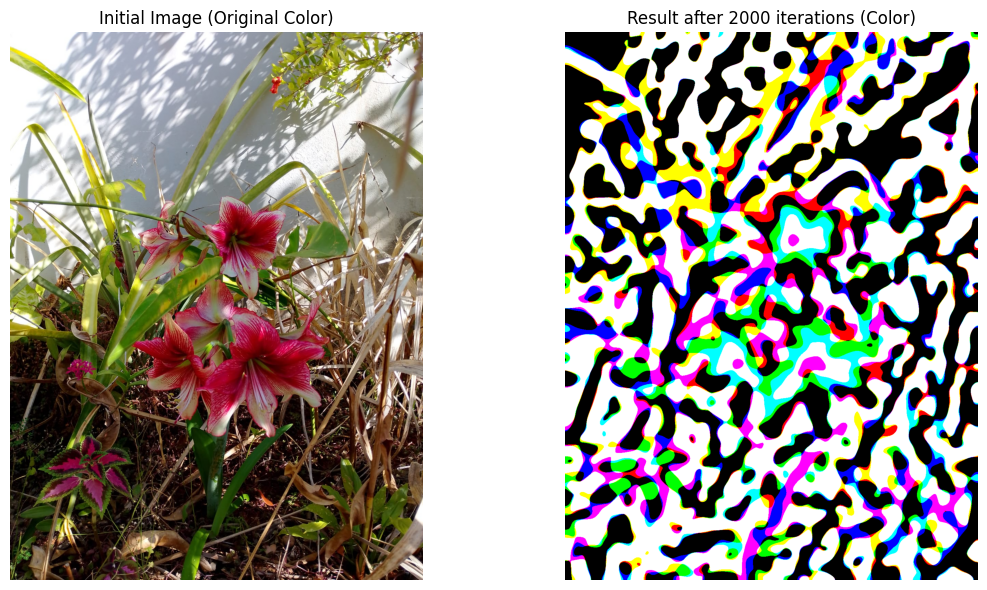

In [5]:
#@title Gradiente descente.
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import laplace
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import img_as_float
from google.colab import files

# Abrir seletor de arquivo
uploaded = files.upload()  # isso vai abrir a janela para você escolher a imagem

# Pegar o nome do arquivo enviado
image_name = list(uploaded.keys())[0]

# Read the image and convert to float for processing
img = imread(image_name)
img_float = img_as_float(img)

is_color = img_float.ndim == 3

if is_color:
    # If RGBA, take only the first 3 channels (RGB)
    if img_float.shape[-1] == 4:
        img_process = img_float[..., :3].copy()
    else:
        img_process = img_float.copy()
    print("Imagem carregada como colorida. Processando cada canal separadamente.")
    Ny, Nx, _ = img_process.shape # Get dimensions for color image
else:
    img_process = img_float.copy()
    print("Imagem carregada como grayscale.")
    Ny, Nx = img_process.shape # Get dimensions for grayscale image


# Gradient Descent parameters
alpha = 0.1  # Step size (learning rate) - acts as time step in heat equation
niter = 2000 # Number of iterations

print(f"Starting Gradient Descent for {niter} iterations with alpha={alpha}")

if is_color:
    u_final_color = np.zeros_like(img_process)
    for channel in range(img_process.shape[-1]):
        u = img_process[..., channel].copy() # Initialize u with the current channel
        # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
        for i in range(niter):
            # Calculate the Laplacian of u
            delta_u = laplace(u)

            # Calculate the gradient of the functional: -Delta u
            gradient_J = -delta_u-u+img_process[..., channel].copy()

            # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
            u = u - alpha * gradient_J

        u_final_color[..., channel] = u
    u_final = u_final_color
else:
    u = img_process.copy() # Initialize u with the grayscale image
    # Gradient Descent loop for minimizing J(u) = 0.5 * ||nabla u||^2
    for i in range(niter):
        # Calculate the Laplacian of u
        delta_u = laplace(u)

        # Calculate the gradient of the functional: -Delta u
        gradient_J = -delta_u-u+img_process.copy()

        # Update u: u = u - alpha * gradient_J  => u = u - alpha * (-Delta u) => u = u + alpha * Delta u
        u = u - alpha * gradient_J
    u_final=u
# --- Visualization ---

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
# Show the initial image (which is the initial u)
if is_color:
    plt.imshow(img_float) # Show original color image
    plt.title('Initial Image (Original Color)')
else:
    plt.imshow(img_float, cmap='gray')
    plt.title('Initial Image (Grayscale)')
plt.axis('off')

plt.subplot(1, 2, 2)
if is_color:
    # Clip values to [0, 1] before displaying color image
    u_final_display = np.clip(u_final, 0, 1)
    plt.imshow(u_final_display)
    plt.title(f"Result after {niter} iterations (Color)")
else:
    plt.imshow(u_final, cmap='gray')
    plt.title(f"Result after {niter} iterations (Grayscale)")
plt.axis('off')

plt.tight_layout()
plt.show()

# --- Save Resulting Image ---
# Optional: Add saving functionality if needed
# output_filename = f'gradient_descent_{niter}_{image_name}'
# u_to_save = (np.clip(u_final, 0, 1) * 255).astype(np.uint8)
# imsave(output_filename, u_to_save)
# print(f"Resulting image saved as '{output_filename}'")

**Regularização com expoente variável e processamento de imagens**

Podemos ainda considerar o funcional
$$
J(u)=\int_{\Omega}\frac{1}{p(x)}\,|\nabla u(x)|^{p(x)}\,dx
\;+\;
\frac{\lambda}{2}\int_{\Omega} (u(x)-g(x))^{2}\,dx,
$$
onde $g$ é a imagem observada (ruidosa), $\lambda>0$ controla a fidelidade aos dados e
$p:\Omega\to[1,2]$ é um expoente variável escolhido de modo a preservar arestas e suavizar regiões homogêneas. Mas vamos deixar isso para um próximo texto.

#**Referências**

[1] N. Akhiezer, Lectures on Integral Transforms. Providence, RI: Amer. Math. Soc.,
1985.

[2] D. U. Pesco and H. J. Bortolossi, “Imagens digitais e matrizes,” Gazeta de Ma-
temática, no. 169, 2019. Traduzido do original publicado em acesso livre como uma
Klein vignette;

[3] J. C. Ferreira, “Quando os métodos de euler e newton coincidem,” Revista Matemática Universitária - SBM, 2021.

[4] G. B. Folland, Fourier Analysis and Its Applications. Providence, RI: American Mathematical Society, 1992.

[5] E. Provenzi, L. D. Carli, A. Rizzi, and D. Marini, “Mathematical definition and analysis of the retinex algorithm,” J. Opt. Soc. Am. A, vol. 22, pp. 2613–2621, Dec
2005.

[6] E. H. Land and J. J. McCann, “Lightness and retinex theory,” Journal of the Optical
Society of America, vol. 61, no. 1, pp. 1–11, 1971.

[7] T. Lindeberg, “Approximation properties relative to continuous scale space for hybrid discretisations of gaussian derivative operators,” Frontiers in Signal Processing,
vol. Volume 4 - 2024, 2025.

[8] J. Koenderink, “The structure of images: 1984–2021,” Biological Cybernetics,
vol. 115, pp. 117–120, 2021.

[9] Elon Lages Lima. Análise no Espaço ℝⁿ. Rio de Janeiro: IMPA, 2025.

[10] Figueiredo, Djairo G. Análise de Fourier e Equações Diferenciais Parciais. 3. ed. Rio de Janeiro: IMPA – Instituto de Matemática Pura e Aplicada, 2014. (Coleção Projeto Euclides).

[11] Leon, Steven J. Álgebra Linear com Aplicações. 8. ed. São Paulo: Pearson, 2010.

[12] Nelson H. T. Lemes, José Claudinei Ferreira, Higor V. M. Ferreira, A Fractional Variational Approach to Spectral Filtering Using the Fourier Transform, [https://arxiv.org/abs/2511.20675](https://arxiv.org/abs/2511.20675)

[13] Leonid I. Rudin, Stanley Osher, Emad Fatemi,
Nonlinear total variation based noise removal algorithms,
Physica D: Nonlinear Phenomena,
Volume 60, Issues 1–4, 1992, [https://doi.org/10.1016/0167-2789(92)90242-F](https://doi.org/10.1016/0167-2789(92)90242-F).